# Assignment 10

In this assignment we'll examine a data set in `diabetes.csv`. 

## Instructions

Please complete this Jupyter notebook and **don't** convert it to a `.py` file. Upload this notebook, along with any `.stan` files and any data sets as a `zip` file to Gradescope. Your work will be manually graded by our TA. 

Protip: if you write your `.stan` file generally enough, it will work with most of the models below, and you won't need to keep recompiling the model object!


In [49]:
import pandas as pd
import numpy as np
import os
from cmdstanpy import CmdStanModel
import matplotlib.pyplot as plt
from scipy import stats
import matplotlib.patches as mpatches
import itertools

## Data Description

This dataset is originally from 

    Reaven, G. M. and Miller, R. G. (1979). An attempt to define the nature of chemical diabetes using a multidimensional analysis. Diabetologia, 16, 17-24. 

The `group` column provides labels that the researches came up with. They should not be taken as fact or used in your finite mixture model (because they are discrete). Interestingly, the labels provided can be used to compare with the labels you might generate from your model.

In [2]:
diab = pd.read_csv("diabetes.csv")
diab.head()

,relwt,glufast,glutest,instest,sspg,group
0,0.81,80,356,124,55,Normal
1,0.95,97,289,117,76,Normal
2,0.94,105,319,143,105,Normal
3,1.04,90,356,199,108,Normal
4,1.00,90,323,240,143,Normal


## Problem 1:

In general, if your data has $D$ columns, and you assume your model has $H$ clusters, how many parameters in total are there for

 - the general case of fully flexible covariance matrices,
 - assuming all groups have the same general covariance structure,
 - assuming variables are uncorrelated in all groups, and
 - assuming that in every group, all features have the same variance *and* are uncorrelated with one another?


# There are 3 general parameters: $\mu$, $\Sigma$, $\lambda$. 
Bullet 1
$\mu$: $H$ * $D$ means 
$\Sigma$: for a $D$ x $D$ covariance matrix is $\frac{D(D+1)}{2}$ for each group $H$  
$\lambda$: $H$ (1 $\lambda$ for each group)  
Total: $H$ * $D$ + $H$ * $\frac{D(D+1)}{2}$ + $H$)

Bullet 2
$\mu$: $H$ * $D$ means  
$\Sigma$: for a $D$ x $D$ covariance matrix is $\frac{D(D+1)}{2}$ This is the same for all variables.  
$\lambda$: $H$ (1 $\lambda$ for each group)  
Total: $H$ * $D$ + $\frac{D(D+1)}{2}$ + $H$

Bullet 3
$\mu$: $H$ * $D$ means  
$\Sigma$: $H$ * $D$ variances (all covariances are 0 since all variables are uncorrelated)  
$\lambda$: $H$ (1 $\lambda$ for each group)  
Total: $H$ * $D$ + $H$ * $D$ + $H$

Bullet 4
$\mu$: $H$ * $D$ means  
$\Sigma$: $H$ (all variances are the same for each group and all covariances are 0 since all variables are uncorrelated)
$\lambda$: $H$ (1 $\lambda$ for each group)  
Total: $H$ * $D$ + $H$ + $H$

## Problem 2: Inference on $\theta$ and $z$

Estimate the parameters of your finite mixture of normals model. Attach your (heavily) modified `.stan` file to your submission so that we may run it when graded your work.

Please be sure to address the following questions about $\theta$ inference:

1. Are you sure your posterior for $\theta$ is identifiable?
2. What did you spend most of your time doing to get this to be so?
3. Discuss the *meaning* of your group categories that you found (i.e. which group is the "healthy" group, etc. etc.)

Please report all the usual stuff, too.

Regarding the $z$ inference:

4. Should you pay attention to $\hat{R}$ diagnostics for `label_prob` variables?
5. Which individual is one of the most difficult to categorize? Why do you think this is interesting to identify?
6. What percentage of the time do your individual person labels correspond to the labels given to you in the `.csv` file?

Finally:

7. Are there any interesting scientific questions that are not addressed by this finite mixture model?

### Hints

**Expect to do a lot of experimentation with**
 - which columns to transform or remove so that everything is conditionally normal, 
 - how many clusters to assume you have, and most of all
 - **how to properly describe your prior beliefs**.

The biggest difficult you will have is trying to specify priors to make the posterior identifiable--to know which cluster group is which. **Remember what we said about $\hat{R}$s in lecture!** Dealing with this also helps with the speed of the algorithm.

More hints: 

 1. Use scatterplots (pairwise or 3-d) to help you visualize how many clusters there need to be. Use Occam's razor!
 2. Feel free to "cheat" in order to come up with priors that identify your posterior. 
 3. While you're figuring everything out, it might be faster to prototype to temporarily restrict your attention to a random subset of the data. 

In [3]:
dia = diab.drop('group', axis=1)

Text(0.5, 1.0, 'sspg')

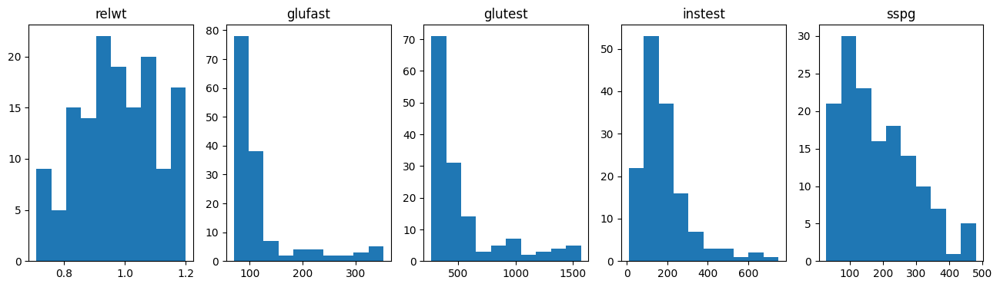

In [4]:
fig1, (a1, b1, c1, d1, e1) = plt.subplots(1, 5, figsize=(16,4))

a1.hist(diab['relwt'])
a1.set_title('relwt')

b1.hist(diab['glufast'])
b1.set_title('glufast')

c1.hist(diab['glutest'])
c1.set_title('glutest')

d1.hist(diab['instest'])
d1.set_title('instest')

e1.hist(diab['sspg'])
e1.set_title('sspg')

In [5]:
log_diab = diab.copy()
log_diab['relwet'] = np.log(diab['relwt'])
log_diab['glufast'] = np.log(diab['glufast'])
log_diab['glutest'] = np.log(diab['glutest'])
log_diab['instest'] = np.log(diab['instest'])
log_diab['sspg'] = np.log(diab['sspg'])

Text(0.5, 1.0, 'log sspg')

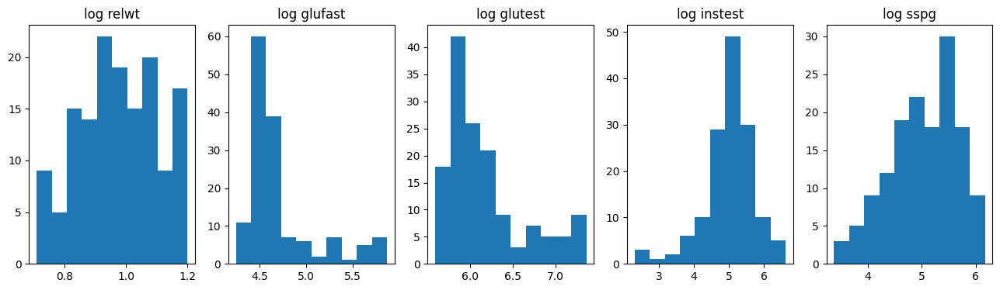

In [6]:
fig2, (a2, b2, c2, d2, e2) = plt.subplots(1, 5, figsize=(16,4))

a2.hist(log_diab['relwt'])
a2.set_title('log relwt')

b2.hist(log_diab['glufast'])
b2.set_title('log glufast')

c2.hist(log_diab['glutest'])
c2.set_title('log glutest')

d2.hist(log_diab['instest'])
d2.set_title('log instest')

e2.hist(log_diab['sspg'])
e2.set_title('log sspg')

In [7]:
sqrt_diab = diab.copy()
sqrt_diab['relwt'] = np.sqrt(diab['relwt'])
sqrt_diab['glufast'] = np.sqrt(diab['glufast'])
sqrt_diab['glutest'] = np.sqrt(diab['glutest'])
sqrt_diab['instest'] = np.sqrt(diab['instest'])
sqrt_diab['sspg'] = np.sqrt(diab['sspg'])

Text(0.5, 1.0, 'sqrt sspg')

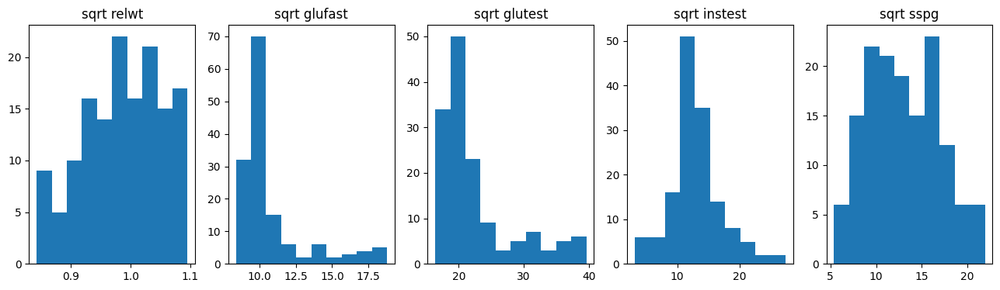

In [8]:
fig3, (a3, b3, c3, d3, e3) = plt.subplots(1, 5, figsize=(16,4))

a3.hist(sqrt_diab['relwt'])
a3.set_title('sqrt relwt')

b3.hist(sqrt_diab['glufast'])
b3.set_title('sqrt glufast')

c3.hist(sqrt_diab['glutest'])
c3.set_title('sqrt glutest')

d3.hist(sqrt_diab['instest'])
d3.set_title('sqrt instest')

e3.hist(sqrt_diab['sspg'])
e3.set_title('sqrt sspg')

In [9]:
bc_diab = diab.copy()
bc_diab['relwt'] = stats.boxcox(diab['relwt'])[0]
bc_diab['glufast'] = stats.boxcox(diab['glufast'])[0]
bc_diab['glutest'] = stats.boxcox(diab['glutest'])[0]
bc_diab['instest'] = stats.boxcox(diab['instest'])[0]
bc_diab['sspg'] = stats.boxcox(diab['sspg'])[0]
bc_diab = bc_diab.drop('group', axis=1)

Text(0.5, 1.0, 'boxcox sspg')

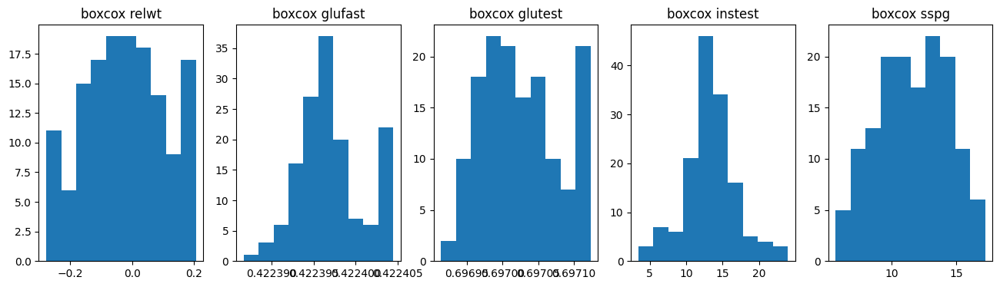

In [10]:
fig4, (a4, b4, c4, d4, e4) = plt.subplots(1, 5, figsize=(16,4))

a4.hist(bc_diab['relwt'])
a4.set_title('boxcox relwt')

b4.hist(bc_diab['glufast'])
b4.set_title('boxcox glufast')

c4.hist(bc_diab['glutest'])
c4.set_title('boxcox glutest')

d4.hist(bc_diab['instest'])
d4.set_title('boxcox instest')

e4.hist(bc_diab['sspg'])
e4.set_title('boxcox sspg')

In [11]:
std_diab = diab.copy()
std_diab['relwt'] = ((diab['relwt'] - diab['relwt'].mean())/ diab['relwt'].std())
std_diab['glufast'] = ((diab['glufast'] - diab['glufast'].mean())/ diab['glufast'].std())
std_diab['glutest'] = ((diab['glutest'] - diab['glutest'].mean())/ diab['glutest'].std())
std_diab['instest'] = ((diab['instest'] - diab['instest'].mean())/ diab['instest'].std())
std_diab['sspg'] = ((diab['sspg'] - diab['sspg'].mean())/ diab['sspg'].std())
std_diab = std_diab.drop('group', axis=1)

Text(0.5, 1.0, 'standardized sspg')

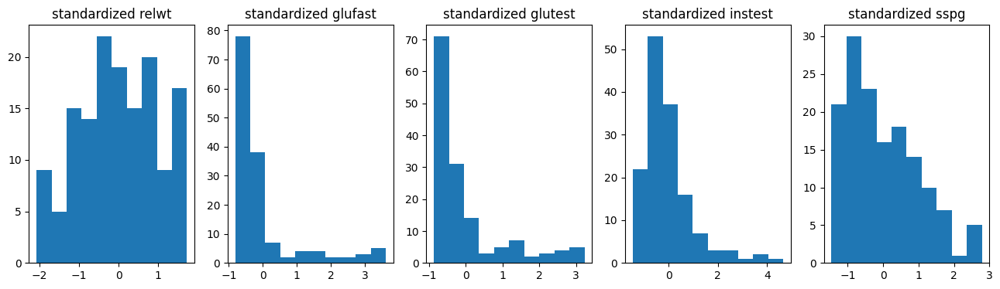

In [12]:
fig5, (a5, b5, c5, d5, e5) = plt.subplots(1, 5, figsize=(16,4))

a5.hist(std_diab['relwt'])
a5.set_title('standardized relwt')

b5.hist(std_diab['glufast'])
b5.set_title('standardized glufast')

c5.hist(std_diab['glutest'])
c5.set_title('standardized glutest')

d5.hist(std_diab['instest'])
d5.set_title('standardized instest')

e5.hist(std_diab['sspg'])
e5.set_title('standardized sspg')

/tmp/ipykernel_7608/3538506150.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_categories))


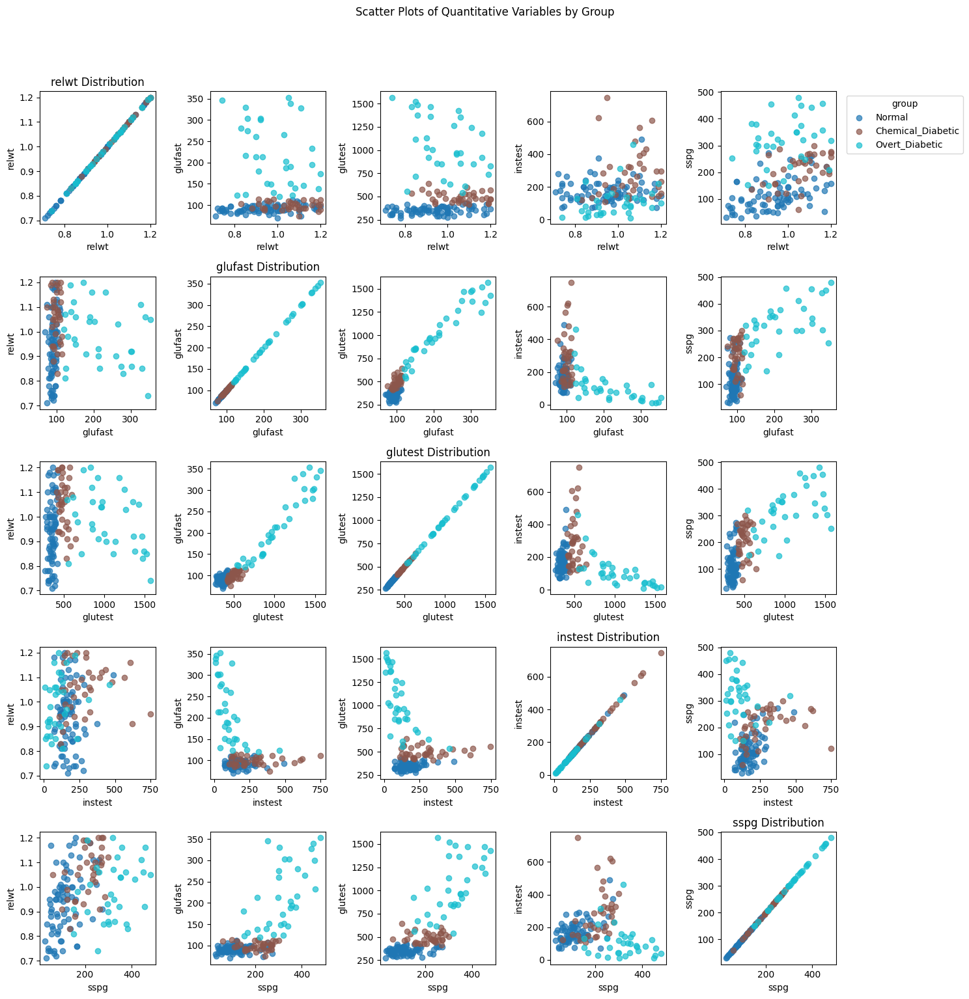

In [13]:
quantitative_vars = ['relwt', 'glufast', 'glutest', 'instest', 'sspg']
categorical_var = 'group'

unique_categories = diab[categorical_var].unique()
colors = plt.cm.get_cmap('tab10', len(unique_categories))
category_to_color = {category: colors(i) for i, category in enumerate(unique_categories)}

num_vars = len(quantitative_vars)
fig, axes = plt.subplots(num_vars, num_vars, figsize=(15, 15))
fig.suptitle('Scatter Plots of Quantitative Variables by Group', y=1.02)


for i, var_x in enumerate(quantitative_vars):
    for j, var_y in enumerate(quantitative_vars):
        ax = axes[i, j]

        for category in unique_categories:
            subset = diab[diab[categorical_var] == category]
            ax.scatter(subset[var_x], subset[var_y], 
                       color=category_to_color[category], 
                       label=category, alpha=0.7)

        ax.set_xlabel(var_x)
        ax.set_ylabel(var_y)
        if i == j:
            ax.set_title(f'{var_x} Distribution')

        if i == 0 and j == num_vars - 1:
            ax.legend(title=categorical_var, bbox_to_anchor=(1.05, 1), loc='upper left') 

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

In [14]:
dia.corr()

,relwt,glufast,glutest,instest,sspg
relwt,1.000000,-0.008813,0.023984,0.222238,0.384320
glufast,-0.008813,1.000000,0.964628,-0.396235,0.715480
glutest,0.023984,0.964628,1.000000,-0.337020,0.770942
instest,0.222238,-0.396235,-0.337020,1.000000,0.007914
sspg,0.384320,0.715480,0.770942,0.007914,1.000000


In [15]:
trans_diab = diab.copy()
trans_diab['relwt'] = ((dia['relwt'] - diab['relwt'].mean())/ diab['relwt'].std())
trans_diab['glufast'] = np.log(diab['glufast'])
trans_diab['glufast'] = ((diab['glufast'] - diab['glufast'].mean())/ diab['glufast'].std())
trans_diab['glutest'] = np.log(diab['glutest'])
trans_diab['glutest'] = ((diab['glutest'] - diab['glutest'].mean())/ diab['glutest'].std())
trans_diab['instest'] = np.log(diab['instest'])
trans_diab['instest'] = ((diab['instest'] - diab['instest'].mean())/ diab['instest'].std())
trans_diab['sspg'] = np.log(diab['sspg'])
trans_diab['sspg'] = ((diab['sspg'] - diab['sspg'].mean())/ diab['sspg'].std())

In [16]:
trans_dia = trans_diab.copy()
trans_dia = trans_dia.drop('group', axis=1)

/tmp/ipykernel_7608/3114044616.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_categories))


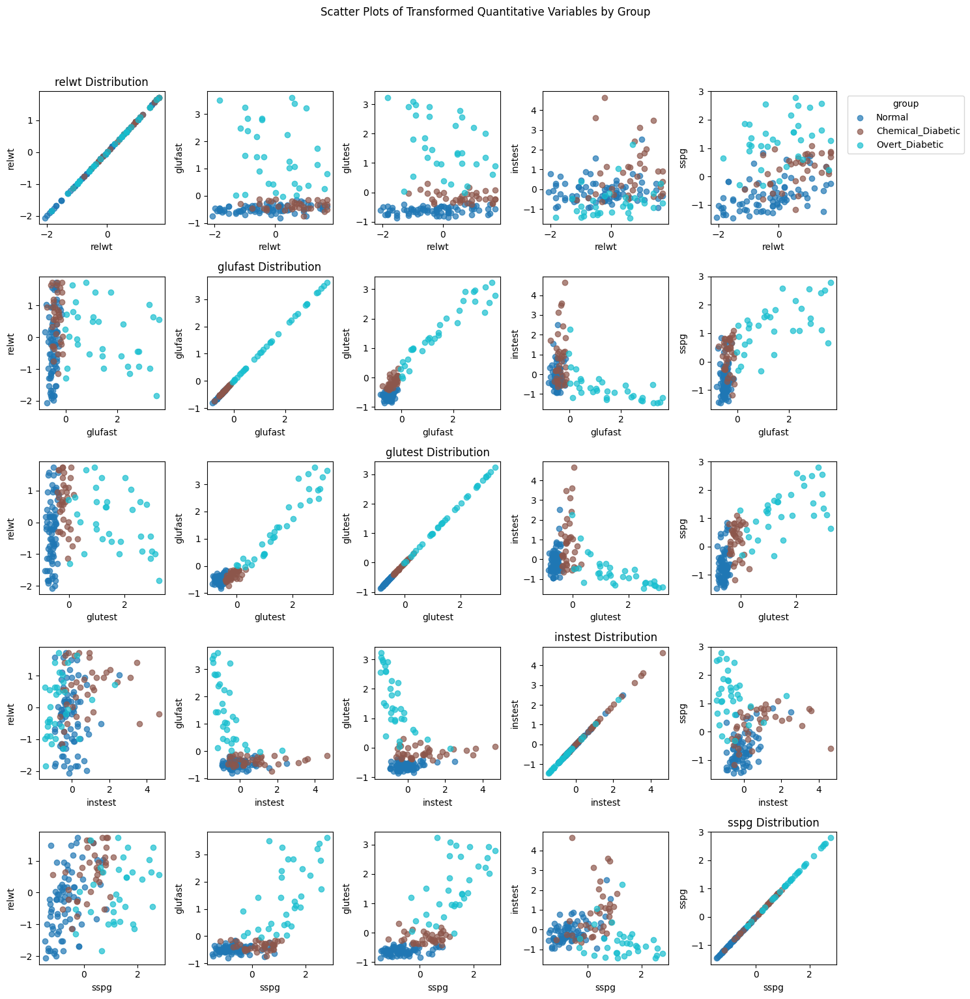

In [17]:
quantitative_vars = ['relwt', 'glufast', 'glutest', 'instest', 'sspg']
categorical_var = 'group'

unique_categories = trans_diab[categorical_var].unique()
colors = plt.cm.get_cmap('tab10', len(unique_categories))
category_to_color = {category: colors(i) for i, category in enumerate(unique_categories)}

num_vars = len(quantitative_vars)
fig, axes = plt.subplots(num_vars, num_vars, figsize=(15, 15))
fig.suptitle('Scatter Plots of Transformed Quantitative Variables by Group', y=1.02)


for i, var_x in enumerate(quantitative_vars):
    for j, var_y in enumerate(quantitative_vars):
        ax = axes[i, j]

        for category in unique_categories:
            subset = trans_diab[trans_diab[categorical_var] == category]
            ax.scatter(subset[var_x], subset[var_y], 
                       color=category_to_color[category], 
                       label=category, alpha=0.7)

        ax.set_xlabel(var_x)
        ax.set_ylabel(var_y)
        if i == j:
            ax.set_title(f'{var_x} Distribution')

        if i == 0 and j == num_vars - 1:
            ax.legend(title=categorical_var, bbox_to_anchor=(1.05, 1), loc='upper left') 

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

In [20]:
trans_dia.corr()

,relwt,glufast,glutest,instest,sspg
relwt,1.000000,-0.008813,0.023984,0.222238,0.384320
glufast,-0.008813,1.000000,0.964628,-0.396235,0.715480
glutest,0.023984,0.964628,1.000000,-0.337020,0.770942
instest,0.222238,-0.396235,-0.337020,1.000000,0.007914
sspg,0.384320,0.715480,0.770942,0.007914,1.000000


In [153]:
tranx_diab = trans_diab.copy()
tranx_diab = tranx_diab.drop('relwt', axis=1)
#tranx_diab = tranx_diab.drop('glufast', axis=1)
#tranx_diab = tranx_diab.drop('glutest', axis=1)
tranx_diab = tranx_diab.drop('instest', axis=1)
#tranx_diab = tranx_diab.drop('sspg', axis=1)

In [154]:
tranx_dia = tranx_diab.copy()
tranx_dia = tranx_dia.drop('group', axis=1)

In [224]:
tranc_diab = diab.copy()
tranc_diab['relwt'] = ((tranc_diab['relwt'] - tranc_diab['relwt'].mean())/ tranc_diab['relwt'].std())
tranc_diab['glufast'] = stats.boxcox(tranc_diab['glufast'])[0]
tranc_diab['glufast'] = ((tranc_diab['glufast'] - tranc_diab['glufast'].mean())/ tranc_diab['glufast'].std())
tranc_diab['glutest'] = stats.boxcox(tranc_diab['glutest'])[0]
tranc_diab['glutest'] = ((tranc_diab['glutest'] - tranc_diab['glutest'].mean())/ tranc_diab['glutest'].std())
tranc_diab['instest'] = stats.boxcox(tranc_diab['instest'])[0]
tranc_diab['instest'] = ((tranc_diab['instest'] - tranc_diab['instest'].mean())/ tranc_diab['instest'].std())
tranc_diab['sspg'] = stats.boxcox(tranc_diab['sspg'])[0]
tranc_diab['sspg'] = ((tranc_diab['sspg'] - tranc_diab['sspg'].mean())/ tranc_diab['sspg'].std())

In [225]:
tranc_dia = tranc_diab.copy()
tranc_dia = tranc_dia.drop('group', axis=1)

In [227]:
tranc_dia = tranc_dia.drop('relwt', axis=1)
#tranc_dia = tranc_dia.drop('glufast', axis=1)
#tranc_dia = tranc_dia.drop('glutest', axis=1)
#tranc_dia = tranc_dia.drop('instest', axis=1)
#tranc_dia = tranc_dia.drop('sspg', axis=1)

In [18]:
modelf_code = os.path.join('.', 'finite_mixture_normals.stan')
modelf = CmdStanModel(stan_file=modelf_code)

In [19]:
f_data = {'N' : dia.shape[0], 'D': dia.shape[1],  'y': dia}
fitf = modelf.sample(data = f_data)

16:51:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

16:55:05 - cmdstanpy - INFO - CmdStan done processing.
16:55:05 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable

In [20]:
fitf.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-3579.330000,0.410902,8.405270,-3593.810000,-3578.830000,-3566.560000,418.43400,1.160770,1.01145
lambda[1],0.251800,0.299527,0.424285,0.000449,0.007411,0.994223,2.00652,0.005566,59.10510
lambda[2],0.251539,0.299596,0.424380,0.000479,0.007359,0.994734,2.00649,0.005566,61.05600
lambda[3],0.496661,0.346035,0.490155,0.000647,0.918900,0.996459,2.00644,0.005566,64.61290


Text(0.5, 1.0, 'lambda 3')

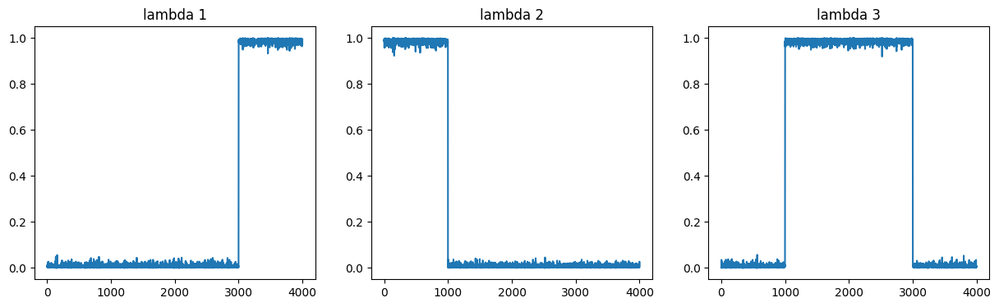

In [41]:
figf, (fa, fb, fc) = plt.subplots(1, 3, figsize=(15,4))

fa.plot(fitf.draws_pd()['lambda[1]'])
fa.set_title('lambda 1')

fb.plot(fitf.draws_pd()['lambda[2]'])
fb.set_title('lambda 2')

fc.plot(fitf.draws_pd()['lambda[3]'])
fc.set_title('lambda 3')

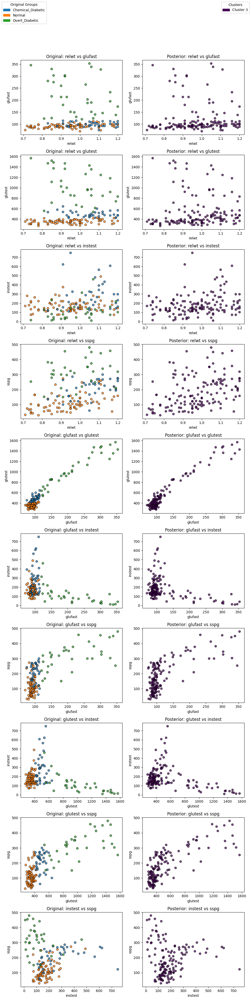

In [60]:
label_probf = fitf.stan_variable('label_prob')
label_probf_mean = np.mean(label_probf, axis=0)
cluster_assignmentf = np.argmax(label_probf_mean, axis=1)

feature_names = list(dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        dia.iloc[:, i], dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        diab.iloc[:, i], diab.iloc[:, j],
        c=cluster_assignmentf, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentf)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [57]:
mapping = {
    'Normal': 0,
    'Chemical_Diabetic': 1,
    'Overt_Diabetic': 2
}
diab_labels = np.array([mapping[g] for g in diab['group'].values])
 
matchf = (cluster_assignmentf == diab_labels)
accuracy = matchf.mean() * 100
 
print("Number of matches:", matchf.sum(), "out of", len(matchf))
print(f"Accuracy: {accuracy:.2f}%")

Number of matches: 33 out of 145
Accuracy: 22.76%


In [21]:
t_data = {'N' : trans_dia.shape[0], 'D': trans_dia.shape[1],  'y': trans_dia}
fitft = modelf.sample(data = t_data)

16:55:06 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

16:56:33 - cmdstanpy - INFO - CmdStan done processing.
16:56:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -inf, but random variable[2,1] = -inf (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional varianc

In [22]:
fitft.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-460.291000,0.238333,7.001210,-472.704000,-459.877000,-449.592000,862.93700,9.344400,1.00106
lambda[1],0.300509,0.126662,0.185642,0.113699,0.222451,0.659197,2.14813,0.023261,3.69908
lambda[2],0.398177,0.146066,0.212296,0.121341,0.433487,0.681655,2.11244,0.022875,4.24127
lambda[3],0.301313,0.120331,0.175790,0.125300,0.226633,0.638815,2.13418,0.023110,3.87407


Text(0.5, 1.0, 'lambda 3')

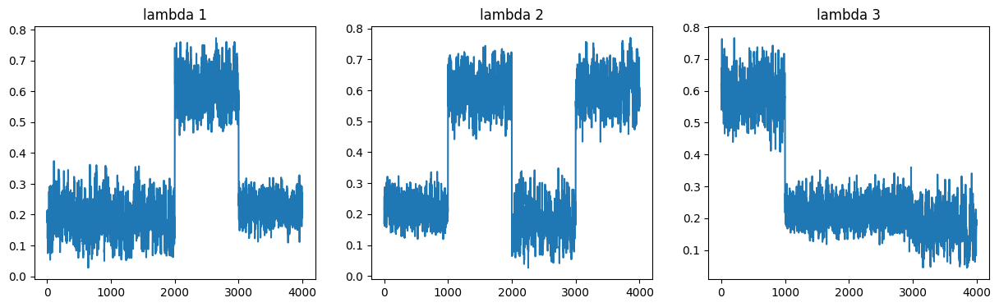

In [42]:
figft, (fta, ftb, ftc) = plt.subplots(1, 3, figsize=(15,4))

fta.plot(fitft.draws_pd()['lambda[1]'])
fta.set_title('lambda 1')

ftb.plot(fitft.draws_pd()['lambda[2]'])
ftb.set_title('lambda 2')

ftc.plot(fitft.draws_pd()['lambda[3]'])
ftc.set_title('lambda 3')

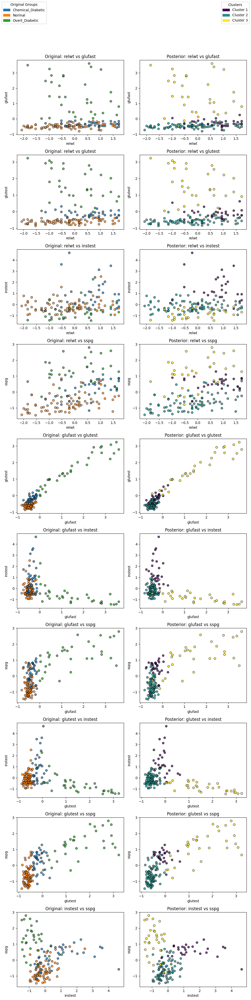

In [78]:
label_probft = fitft.stan_variable('label_prob')
label_probft_mean = np.mean(label_probft, axis=0)
cluster_assignmentft = np.argmax(label_probft_mean, axis=1)

feature_names = list(trans_dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = trans_diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        trans_dia.iloc[:, i], trans_dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        trans_diab.iloc[:, i], trans_diab.iloc[:, j],
        c=cluster_assignmentft, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentft)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [86]:
mapping = {
    'Normal': 1,
    'Chemical_Diabetic': 0,
    'Overt_Diabetic': 2
}
diab_labels = np.array([mapping[g] for g in diab['group'].values])
 
matchft = (cluster_assignmentft == diab_labels)
accuracy = matchft.mean() * 100
 
print("Number of matches:", matchft.sum(), "out of", len(matchft))
print(f"Accuracy: {accuracy:.2f}%")

Number of matches: 122 out of 145
Accuracy: 84.14%


In [155]:
x_data = {'N' : tranx_dia.shape[0], 'D': tranx_dia.shape[1],  'y': tranx_dia}
fitfx = modelf.sample(data = x_data)

19:44:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

19:46:41 - cmdstanpy - INFO - CmdStan done processing.
19:46:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional variance is -nan. (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional variance i

In [156]:
fitfx.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-220.757000,2.364560,7.018080,-231.696000,-221.350000,-209.167000,8.80920,0.128916,1.19556
lambda[1],0.387436,0.263032,0.373624,0.000944,0.623869,0.809637,2.01768,0.029527,12.52890
lambda[2],0.192153,0.021563,0.061679,0.068496,0.200133,0.279165,8.18194,0.119736,1.26316
lambda[3],0.420410,0.244280,0.349205,0.003218,0.562145,0.814090,2.04356,0.029906,7.81618


Text(0.5, 1.0, 'lambda 3')

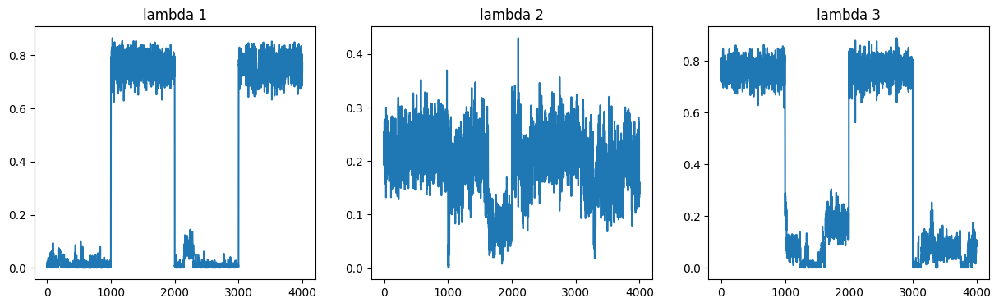

In [157]:
figfx, (fxa, fxb, fxc) = plt.subplots(1, 3, figsize=(15,4))

fxa.plot(fitfx.draws_pd()['lambda[1]'])
fxa.set_title('lambda 1')

fxb.plot(fitfx.draws_pd()['lambda[2]'])
fxb.set_title('lambda 2')

fxc.plot(fitfx.draws_pd()['lambda[3]'])
fxc.set_title('lambda 3')

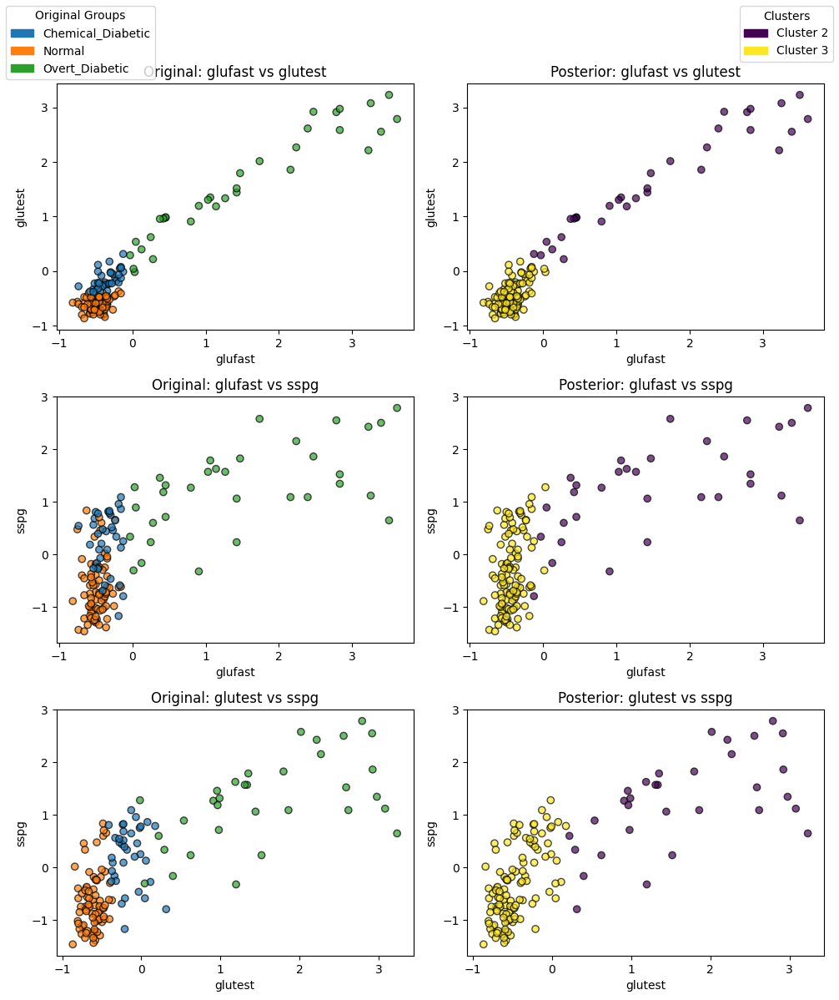

In [158]:
label_probfx = fitfx.stan_variable('label_prob')
label_probfx_mean = np.mean(label_probfx, axis=0)
cluster_assignmentfx = np.argmax(label_probfx_mean, axis=1)

feature_names = list(tranx_dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = tranx_diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        tranx_dia.iloc[:, i], tranx_dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        tranx_diab.iloc[:, i], tranx_diab.iloc[:, j],
        c=cluster_assignmentfx, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentfx)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [151]:
mapping = {
    'Normal': 0,
    'Chemical_Diabetic': 1,
    'Overt_Diabetic': 2
}
diab_labels = np.array([mapping[g] for g in diab['group'].values])
 
matchfx = (cluster_assignmentfx == diab_labels)
accuracy = matchfx.mean() * 100
 
print("Number of matches:", matchfx.sum(), "out of", len(matchfx))
print(f"Accuracy: {accuracy:.2f}%")

Number of matches: 93 out of 145
Accuracy: 64.14%


In [228]:
c_data = {'N' : tranc_dia.shape[0], 'D': tranc_dia.shape[1],  'y': tranc_dia}
fitfc = modelf.sample(data = c_data)

20:47:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:47:43 - cmdstanpy - INFO - CmdStan done processing.
20:47:43 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional variance is -nan. (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional variance is -nan. (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional variance is -nan. (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,3] = -nan, but random variable[3,1] =

In [229]:
fitfc.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-478.243000,0.204091,4.625880,-486.735000,-477.827000,-471.529000,513.73800,14.314600,1.00427
lambda[1],0.409514,0.142877,0.209448,0.161231,0.377697,0.711970,2.14895,0.059878,3.73804
lambda[2],0.391166,0.132062,0.210016,0.157640,0.263477,0.713969,2.52900,0.070467,2.27555
lambda[3],0.199319,0.021700,0.114234,0.068944,0.181883,0.385158,27.71270,0.772177,1.09335


Text(0.5, 1.0, 'lambda 3')

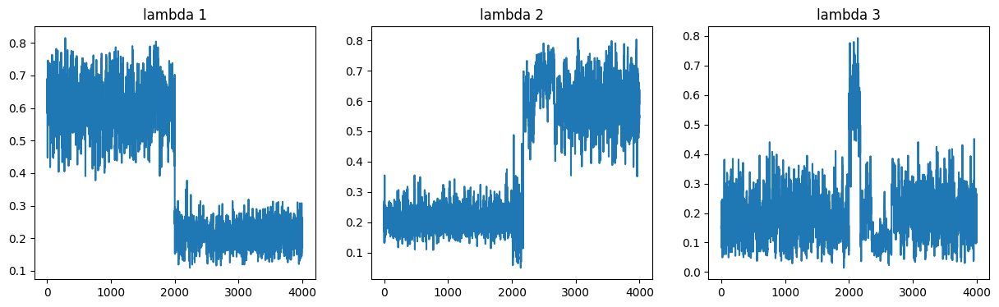

In [230]:
figfc, (fca, fcb, fcc) = plt.subplots(1, 3, figsize=(15,4))

fca.plot(fitfc.draws_pd()['lambda[1]'])
fca.set_title('lambda 1')

fcb.plot(fitfc.draws_pd()['lambda[2]'])
fcb.set_title('lambda 2')

fcc.plot(fitfc.draws_pd()['lambda[3]'])
fcc.set_title('lambda 3')

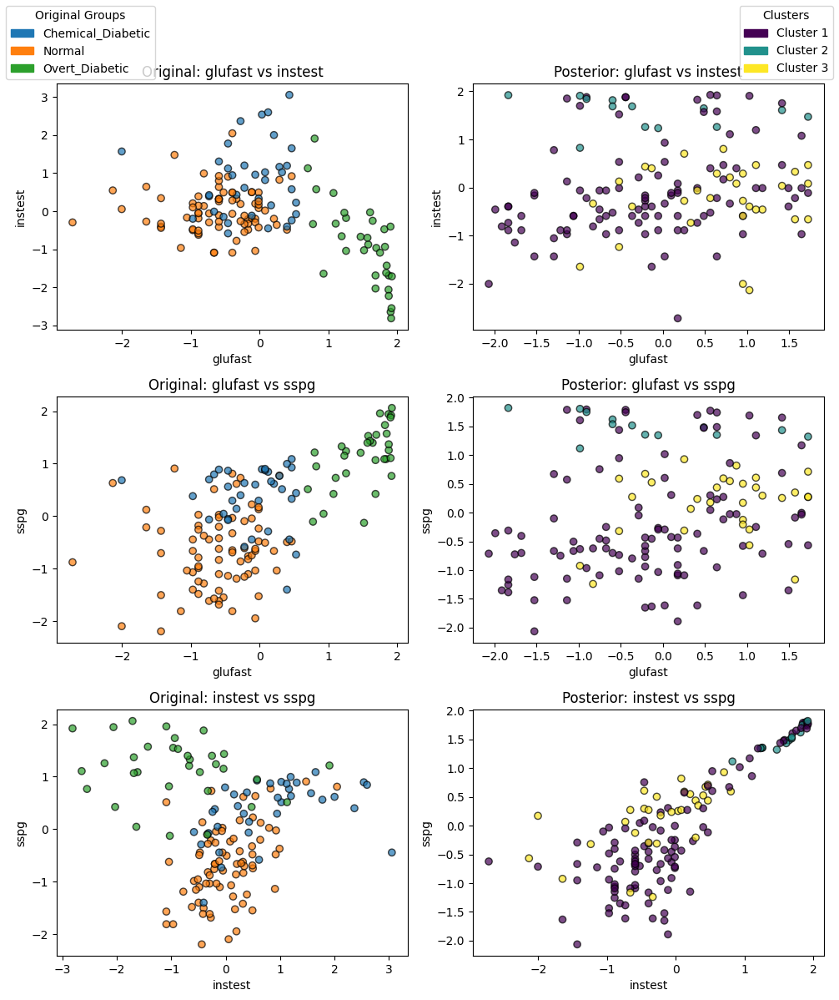

In [231]:
label_probfc = fitfc.stan_variable('label_prob')
label_probfc_mean = np.mean(label_probfc, axis=0)
cluster_assignmentfc = np.argmax(label_probfc_mean, axis=1)

feature_names = list(tranc_dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = tranc_diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        tranc_dia.iloc[:, i], tranc_dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        tranc_diab.iloc[:, i], tranc_diab.iloc[:, j],
        c=cluster_assignmentfc, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentfc)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [232]:
mapping = {
    'Normal': 2,
    'Chemical_Diabetic': 0,
    'Overt_Diabetic': 1
}
diab_labels = np.array([mapping[g] for g in diab['group'].values])
 
matchfc = (cluster_assignmentfc == diab_labels)
accuracy = matchfc.mean() * 100
 
print("Number of matches:", matchfc.sum(), "out of", len(matchfc))
print(f"Accuracy: {accuracy:.2f}%")

Number of matches: 36 out of 145
Accuracy: 24.83%


In [24]:
modelp_code = os.path.join('.', 'parsed_mu.stan')
modelp = CmdStanModel(stan_file=modelp_code)

16:56:51 - cmdstanpy - INFO - compiling stan file /tmp/tmpb96twyf9/tmpaet_tkr8.stan to exe file /bml24/Assignment 10/parsed_mu
16:57:22 - cmdstanpy - INFO - compiled model executable: /bml24/Assignment 10/parsed_mu


In [25]:
p_data = {'N' : dia.shape[0], 'D': dia.shape[1],  'y': dia}
fitp = modelp.sample(data = p_data)

16:57:22 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

17:03:03 - cmdstanpy - INFO - CmdStan done processing.
17:03:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,3] = -nan, but random variable[3,1] = -nan (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,3] = -nan, but random variable[3,1] = -nan (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,3] = -nan, but random variable[3,1] = -nan (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,3] = -nan, but random variable[3,1] = -nan (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,3] = -nan, but random variable[3,1] = -nan (in 'parsed_mu.stan', line 31, column 4

In [26]:
fitp.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-3599.990000,0.520767,8.482810,-3614.570000,-3599.690000,-3586.700000,265.33300,0.561757,1.026430
lambda[1],0.031241,0.000168,0.013246,0.012487,0.029433,0.056255,6246.71000,13.225400,0.999499
lambda[2],0.711047,0.277134,0.392812,0.019560,0.930678,0.963244,2.00904,0.004253,24.132900
lambda[3],0.257712,0.277026,0.392584,0.013747,0.035413,0.952955,2.00828,0.004252,27.855300


Text(0.5, 1.0, 'lambda 3')

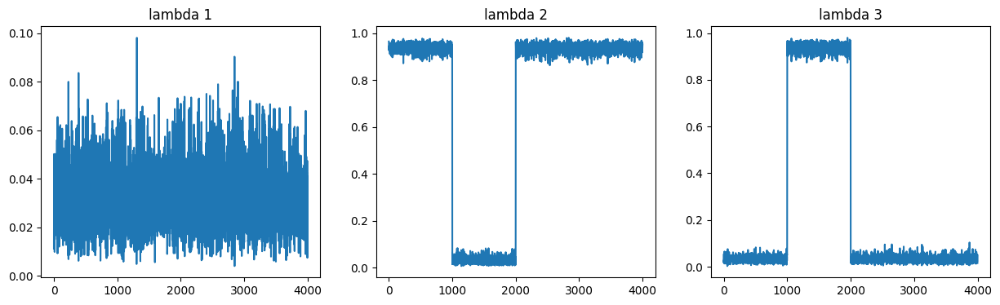

In [43]:
figp, (pa, pb, pc) = plt.subplots(1, 3, figsize=(15,4))

pa.plot(fitp.draws_pd()['lambda[1]'])
pa.set_title('lambda 1')

pb.plot(fitp.draws_pd()['lambda[2]'])
pb.set_title('lambda 2')

pc.plot(fitp.draws_pd()['lambda[3]'])
pc.set_title('lambda 3')

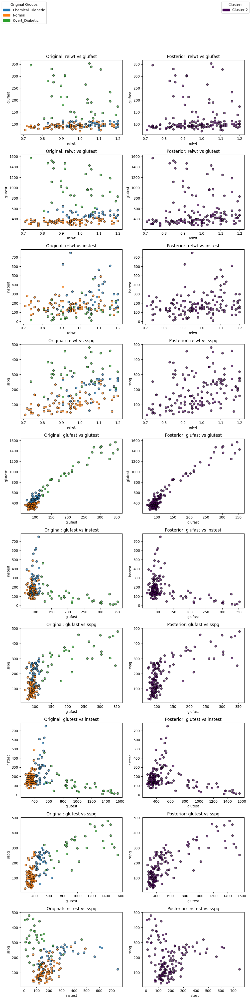

In [59]:
label_probp = fitp.stan_variable('label_prob')
label_probp_mean = np.mean(label_probp, axis=0)
cluster_assignmentp = np.argmax(label_probp_mean, axis=1)

feature_names = list(dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        dia.iloc[:, i], dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        diab.iloc[:, i], diab.iloc[:, j],
        c=cluster_assignmentp, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentp)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [87]:
mapping = {
    'Normal': 0,
    'Chemical_Diabetic': 1,
    'Overt_Diabetic': 2
}
diab_labels = np.array([mapping[g] for g in diab['group'].values])
 
matchp = (cluster_assignmentp == diab_labels)
accuracy = matchp.mean() * 100
 
print("Number of matches:", matchp.sum(), "out of", len(matchp))
print(f"Accuracy: {accuracy:.2f}%")

Number of matches: 36 out of 145
Accuracy: 24.83%


In [27]:
t_data = {'N' : trans_dia.shape[0], 'D': trans_dia.shape[1],  'y': trans_dia}
fitpt = modelp.sample(data = t_data)

17:03:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

17:06:48 - cmdstanpy - INFO - CmdStan done processing.
17:06:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = inf, but random variable[2,1] = inf (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = inf, but random variable[2,1] = inf (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = inf, but random variable[2,1] = inf (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional variance is 0.176925. (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = inf, but random variable[2,1] = inf (in 'parsed_mu.stan', line 31, column 4 to co

In [28]:
fitpt.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-576.865000,7.182850,12.068000,-597.718000,-576.247000,-557.728000,2.82277,0.008170,1.80642
lambda[1],0.597593,0.161551,0.230998,0.174273,0.713719,0.784072,2.04453,0.005918,6.85168
lambda[2],0.304029,0.175513,0.250238,0.056173,0.205855,0.755524,2.03278,0.005884,8.18264
lambda[3],0.098377,0.042307,0.063986,0.034207,0.072157,0.227582,2.28744,0.006621,2.70612


Text(0.5, 1.0, 'lambda 3')

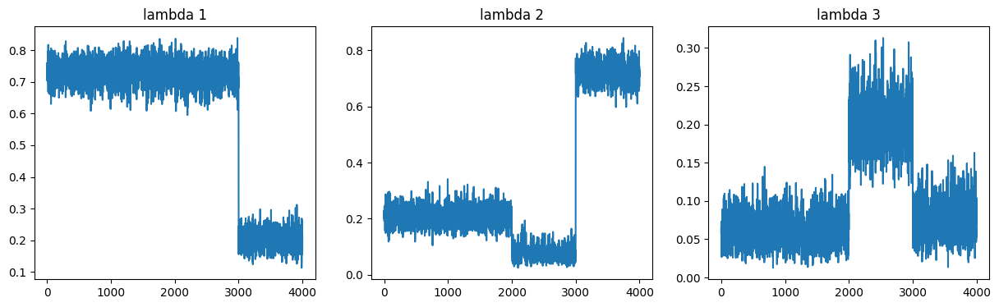

In [44]:
figpt, (pta, ptb, ptc) = plt.subplots(1, 3, figsize=(15,4))

pta.plot(fitpt.draws_pd()['lambda[1]'])
pta.set_title('lambda 1')

ptb.plot(fitpt.draws_pd()['lambda[2]'])
ptb.set_title('lambda 2')

ptc.plot(fitpt.draws_pd()['lambda[3]'])
ptc.set_title('lambda 3')

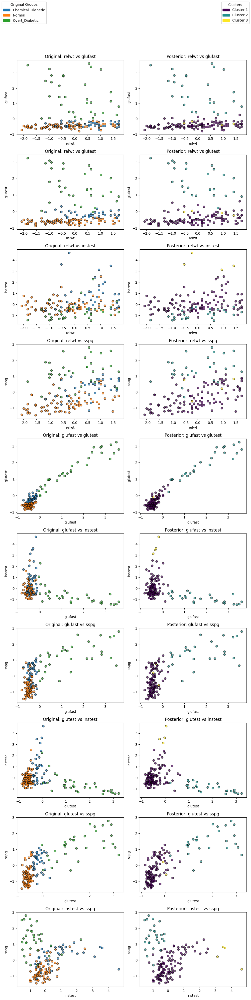

In [79]:
label_probpt = fitpt.stan_variable('label_prob')
label_probpt_mean = np.mean(label_probpt, axis=0)
cluster_assignmentpt = np.argmax(label_probpt_mean, axis=1)

feature_names = list(trans_dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = trans_diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        trans_dia.iloc[:, i], trans_dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        trans_diab.iloc[:, i], trans_diab.iloc[:, j],
        c=cluster_assignmentpt, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentpt)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [88]:
mapping = {
    'Normal': 0,
    'Chemical_Diabetic': 2,
    'Overt_Diabetic': 1
}
diab_labels = np.array([mapping[g] for g in diab['group'].values])
 
matchpt = (cluster_assignmentpt == diab_labels)
accuracy = matchpt.mean() * 100
 
print("Number of matches:", matchpt.sum(), "out of", len(matchpt))
print(f"Accuracy: {accuracy:.2f}%")

Number of matches: 107 out of 145
Accuracy: 73.79%


In [159]:
x_data = {'N' : tranx_dia.shape[0], 'D': tranx_dia.shape[1],  'y': tranx_dia}
fitpx = modelp.sample(data = x_data)

19:46:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

19:48:23 - cmdstanpy - INFO - CmdStan done processing.
19:48:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional variance is -4.54747e-13. (in 'parsed_mu.stan', line 31, column 4 to column 65)
Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = inf, but random variable[2,1] = inf (in 'parsed_mu.stan', line 31, colum

In [160]:
fitpx.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-270.102000,2.082080,5.382210,-279.598000,-269.785000,-261.840000,6.68228,0.066134,1.20034
lambda[1],0.393397,0.256069,0.363448,0.015383,0.612129,0.797980,2.01451,0.019937,14.47660
lambda[2],0.485435,0.192869,0.274865,0.171291,0.640466,0.803128,2.03102,0.020101,8.46819
lambda[3],0.121168,0.063956,0.093459,0.014872,0.107897,0.255011,2.13541,0.021134,3.83125


Text(0.5, 1.0, 'lambda 3')

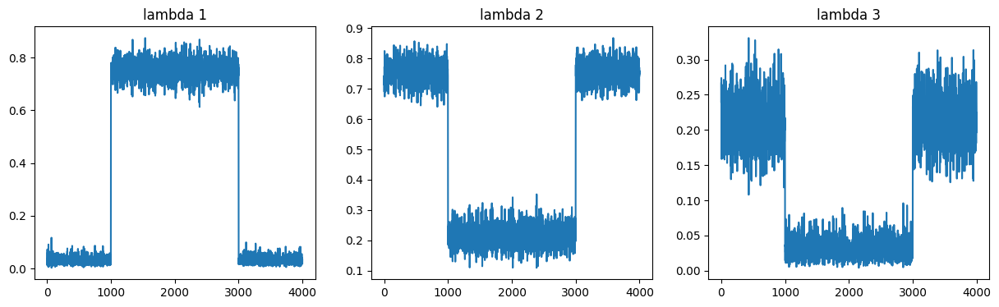

In [161]:
figpx, (pxa, pxb, pxc) = plt.subplots(1, 3, figsize=(15,4))

pxa.plot(fitpx.draws_pd()['lambda[1]'])
pxa.set_title('lambda 1')

pxb.plot(fitpx.draws_pd()['lambda[2]'])
pxb.set_title('lambda 2')

pxc.plot(fitpx.draws_pd()['lambda[3]'])
pxc.set_title('lambda 3')

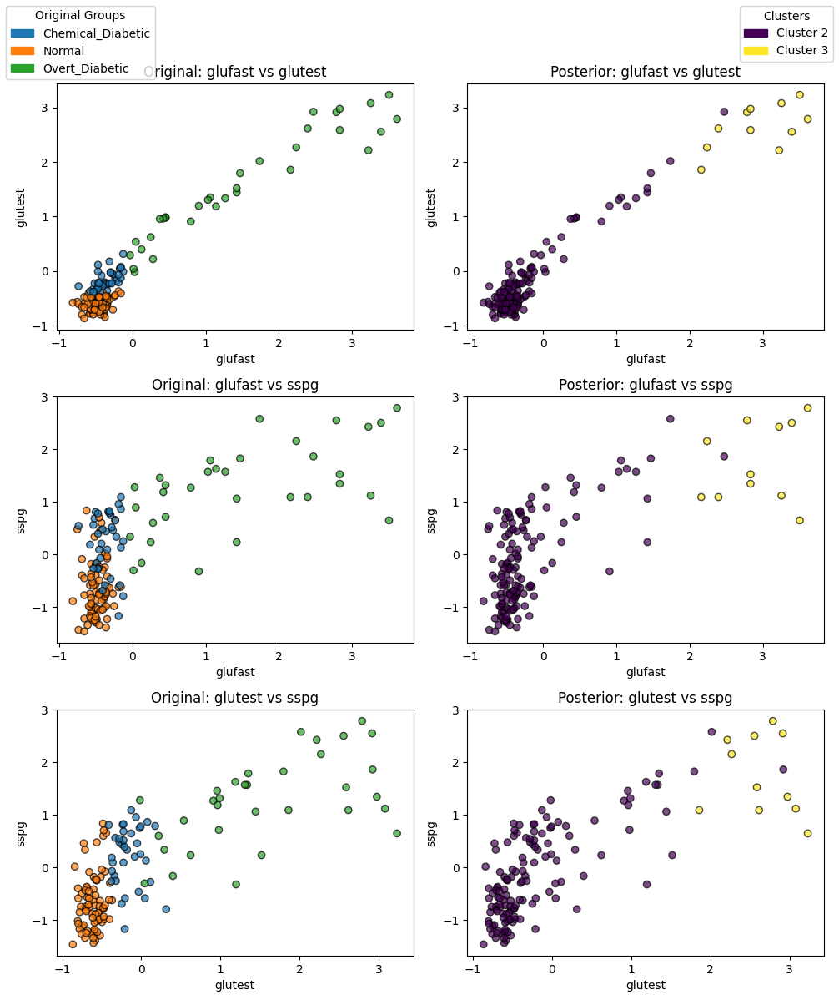

In [162]:
label_probpx = fitpx.stan_variable('label_prob')
label_probpx_mean = np.mean(label_probpx, axis=0)
cluster_assignmentpx = np.argmax(label_probpx_mean, axis=1)

feature_names = list(tranx_dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = tranx_diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        tranx_dia.iloc[:, i], tranx_dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        tranx_diab.iloc[:, i], tranx_diab.iloc[:, j],
        c=cluster_assignmentpx, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentpx)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [152]:
mapping = {
    'Normal': 0,
    'Chemical_Diabetic': 2,
    'Overt_Diabetic': 1
}
diab_labels = np.array([mapping[g] for g in diab['group'].values])
 
matchpx = (cluster_assignmentpx == diab_labels)
accuracy = matchpx.mean() * 100
 
print("Number of matches:", matchpx.sum(), "out of", len(matchpx))
print(f"Accuracy: {accuracy:.2f}%")

Number of matches: 106 out of 145
Accuracy: 73.10%


In [233]:
c_data = {'N' : tranc_dia.shape[0], 'D': tranc_dia.shape[1],  'y': tranc_dia}
fitpc = modelp.sample(data = c_data)

20:48:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:49:40 - cmdstanpy - INFO - CmdStan done processing.
20:49:40 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional variance is -2.84217e-14. (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,3] = -nan, but random variable[3,1] = -nan (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional variance is -1.26897e-116. (in 'parsed_mu.stan', line 31, column 4 to column 65)
Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -inf, but random variable[2,1] = -inf (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -inf, but random variable[2,1] = -inf (in 'parsed_mu.stan', line 

In [234]:
fitpc.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-576.532000,0.144916,4.627390,-584.797000,-576.127000,-569.874000,1019.62,9.50788,1.005920
lambda[1],0.709339,0.000742,0.041879,0.637466,0.710243,0.776537,3184.96,29.69940,1.001520
lambda[2],0.258957,0.000758,0.041222,0.192491,0.258474,0.328211,2955.67,27.56120,1.001640
lambda[3],0.031704,0.000188,0.014048,0.012756,0.029748,0.057327,5591.09,52.13630,0.999782


Text(0.5, 1.0, 'lambda 3')

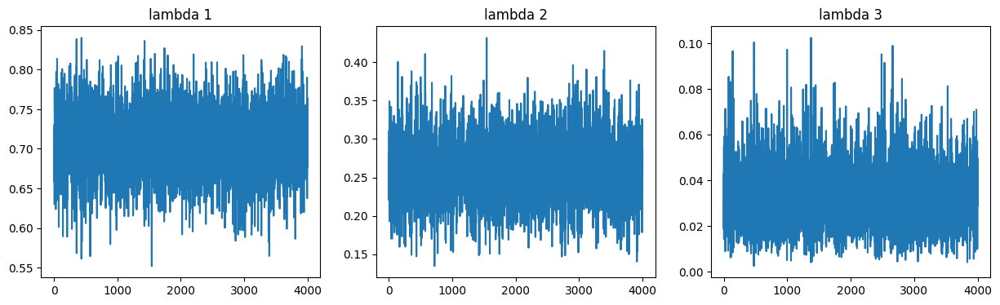

In [235]:
figpc, (pca, pcb, pcc) = plt.subplots(1, 3, figsize=(15,4))

pca.plot(fitpc.draws_pd()['lambda[1]'])
pca.set_title('lambda 1')

pcb.plot(fitpc.draws_pd()['lambda[2]'])
pcb.set_title('lambda 2')

pcc.plot(fitpc.draws_pd()['lambda[3]'])
pcc.set_title('lambda 3')

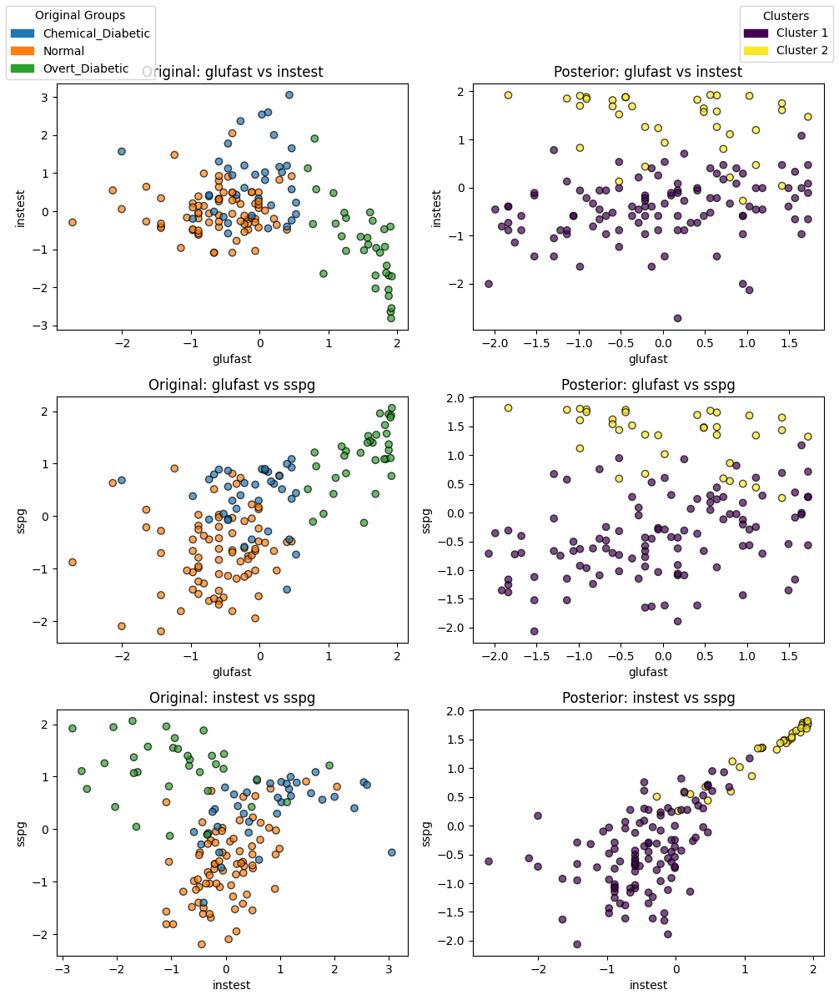

In [236]:
label_probpc = fitpc.stan_variable('label_prob')
label_probpc_mean = np.mean(label_probpc, axis=0)
cluster_assignmentpc = np.argmax(label_probpc_mean, axis=1)

feature_names = list(tranc_dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = tranc_diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        tranc_dia.iloc[:, i], tranc_dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        tranc_diab.iloc[:, i], tranc_diab.iloc[:, j],
        c=cluster_assignmentpc, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentpc)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [223]:
mapping = {
    'Normal': 2,
    'Chemical_Diabetic': 0,
    'Overt_Diabetic': 1
}
diab_labels = np.array([mapping[g] for g in diab['group'].values])
 
matchpc = (cluster_assignmentpc == diab_labels)
accuracy = matchpc.mean() * 100
 
print("Number of matches:", matchpc.sum(), "out of", len(matchpc))
print(f"Accuracy: {accuracy:.2f}%")

Number of matches: 113 out of 145
Accuracy: 77.93%


In [163]:
modell_code = os.path.join('.', 'lkj.stan')
modell = CmdStanModel(stan_file=modell_code)

In [63]:
l_data = {'N' : dia.shape[0], 'D': dia.shape[1],  'y': dia}
fitl = modell.sample(data = l_data)

17:53:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

17:55:23 - cmdstanpy - INFO - CmdStan done processing.
17:55:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.st

In [64]:
fitl.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-3479.030000,0.171338,5.999930,-3489.600000,-3478.670000,-3469.810000,1226.26000,7.811680,1.0010
lambda[1],0.251721,0.299665,0.424475,0.000492,0.007344,0.993951,2.00647,0.012782,62.2807
lambda[2],0.251801,0.299474,0.424207,0.000585,0.007806,0.994370,2.00649,0.012782,60.8615
lambda[3],0.496477,0.345837,0.489873,0.000902,0.932091,0.996042,2.00643,0.012782,65.0388


Text(0.5, 1.0, 'lambda 3')

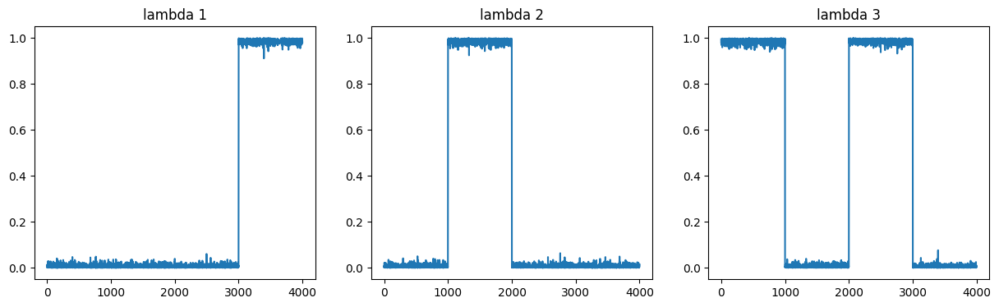

In [65]:
figl, (la, lb, lc) = plt.subplots(1, 3, figsize=(15,4))

la.plot(fitl.draws_pd()['lambda[1]'])
la.set_title('lambda 1')

lb.plot(fitl.draws_pd()['lambda[2]'])
lb.set_title('lambda 2')

lc.plot(fitl.draws_pd()['lambda[3]'])
lc.set_title('lambda 3')

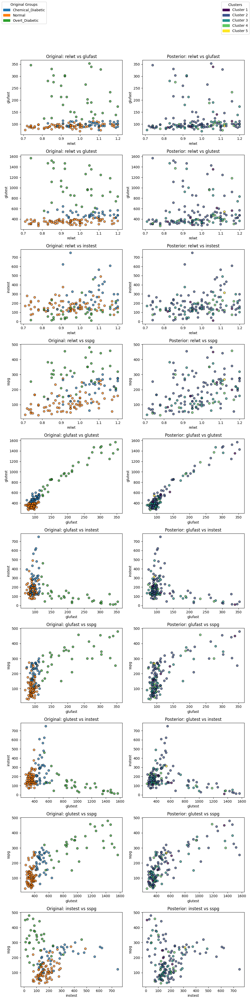

In [80]:
label_probl = fitl.stan_variable('label_prob')
label_probl_mean = np.mean(label_probl, axis=0)
cluster_assignmentl = np.argmax(label_probl_mean, axis=1)

feature_names = list(dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        dia.iloc[:, i], dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        diab.iloc[:, i], diab.iloc[:, j],
        c=cluster_assignmentl, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentl)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [67]:
t_data = {'N' : trans_dia.shape[0], 'D': trans_dia.shape[1],  'y': trans_dia}
fitlt = modell.sample(data = t_data)

17:55:29 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

17:56:20 - cmdstanpy - INFO - CmdStan done processing.
17:56:20 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[3] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[3] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[3] is 0, but must be positive! (in 'lkj.st

In [68]:
fitlt.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-492.443000,0.163153,5.924010,-502.613000,-492.098000,-483.296000,1318.38000,25.450300,1.00240
lambda[1],0.315200,0.097701,0.144082,0.162049,0.258676,0.586678,2.17482,0.041983,3.39033
lambda[2],0.386056,0.115280,0.167706,0.164455,0.393480,0.605302,2.11637,0.040855,4.12481
lambda[3],0.298744,0.102975,0.150415,0.153107,0.233082,0.587783,2.13364,0.041188,3.85931


Text(0.5, 1.0, 'lambda 3')

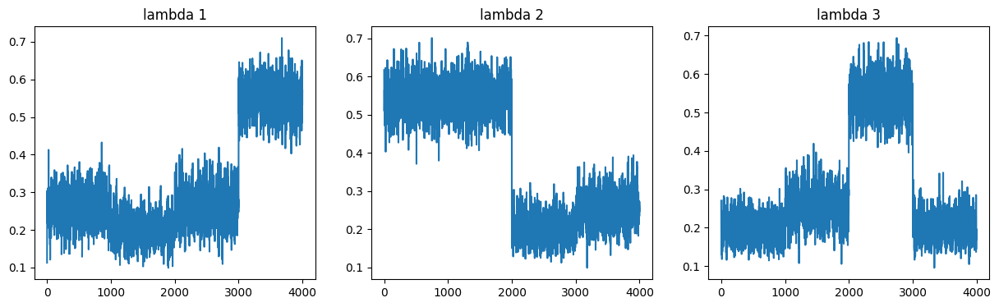

In [69]:
figlt, (lta, ltb, ltc) = plt.subplots(1, 3, figsize=(15,4))

lta.plot(fitlt.draws_pd()['lambda[1]'])
lta.set_title('lambda 1')

ltb.plot(fitlt.draws_pd()['lambda[2]'])
ltb.set_title('lambda 2')

ltc.plot(fitlt.draws_pd()['lambda[3]'])
ltc.set_title('lambda 3')

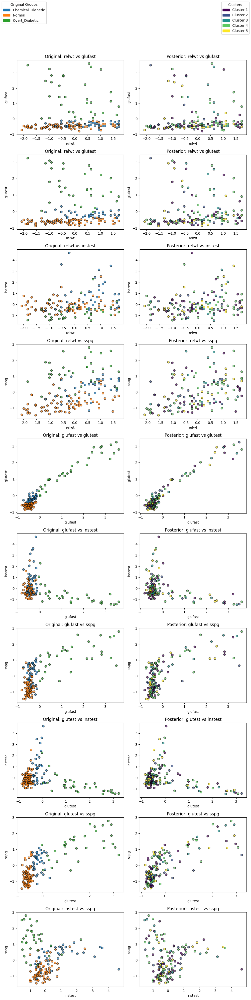

In [81]:
label_problt = fitlt.stan_variable('label_prob')
label_problt_mean = np.mean(label_problt, axis=0)
cluster_assignmentlt = np.argmax(label_problt_mean, axis=1)

feature_names = list(trans_dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = trans_diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        trans_dia.iloc[:, i], trans_dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        trans_diab.iloc[:, i], trans_diab.iloc[:, j],
        c=cluster_assignmentlt, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentlt)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [199]:
posterior_sdf = fitst.draws_pd()
mu_samples = posterior_sdf.filter(like="mu")
mu_samples.columns

Index(['mu_dim1[1]', 'mu_dim1[2]', 'mu_dim1[3]', 'mu_rest[1,1]',
       'mu_rest[2,1]', 'mu_rest[3,1]', 'mu_rest[1,2]', 'mu_rest[2,2]',
       'mu_rest[3,2]', 'mu_rest[1,3]', 'mu_rest[2,3]', 'mu_rest[3,3]',
       'mu[1,1]', 'mu[2,1]', 'mu[3,1]', 'mu[1,2]', 'mu[2,2]', 'mu[3,2]',
       'mu[1,3]', 'mu[2,3]', 'mu[3,3]', 'mu[1,4]', 'mu[2,4]', 'mu[3,4]'],
      dtype='object')

Text(0.5, 1.0, 'mu[3,4]')

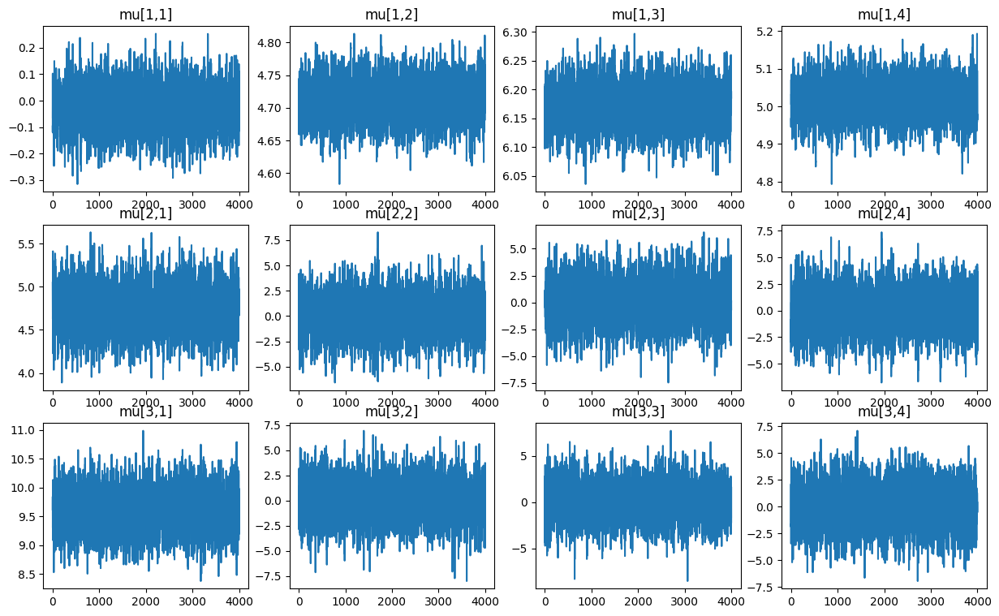

In [201]:
figsm, axsm = plt.subplots(3, 4, figsize=(15,9))

axsm[0,0].plot(fitst.draws_pd()['mu[1,1]'])
axsm[0,0].set_title('mu[1,1]')

axsm[0,1].plot(fitst.draws_pd()['mu[1,2]'])
axsm[0,1].set_title('mu[1,2]')

axsm[0,2].plot(fitst.draws_pd()['mu[1,3]'])
axsm[0,2].set_title('mu[1,3]')

axsm[0,3].plot(fitst.draws_pd()['mu[1,4]'])
axsm[0,3].set_title('mu[1,4]')

axsm[1,0].plot(fitst.draws_pd()['mu[2,1]'])
axsm[1,0].set_title('mu[2,1]')

axsm[1,1].plot(fitst.draws_pd()['mu[2,2]'])
axsm[1,1].set_title('mu[2,2]')

axsm[1,2].plot(fitst.draws_pd()['mu[2,3]'])
axsm[1,2].set_title('mu[2,3]')

axsm[1,3].plot(fitst.draws_pd()['mu[2,4]'])
axsm[1,3].set_title('mu[2,4]')

axsm[2,0].plot(fitst.draws_pd()['mu[3,1]'])
axsm[2,0].set_title('mu[3,1]')

axsm[2,1].plot(fitst.draws_pd()['mu[3,2]'])
axsm[2,1].set_title('mu[3,2]')

axsm[2,2].plot(fitst.draws_pd()['mu[3,3]'])
axsm[2,2].set_title('mu[3,3]')

axsm[2,3].plot(fitst.draws_pd()['mu[3,4]'])
axsm[2,3].set_title('mu[3,4]')

In [40]:
#posterior_df = fits.draws_pd()
#mu_samples = posterior_df[['mu[1,1]', 'mu[2,1]', 'mu[3,1]', 'mu[1,2]', 'mu[2,2]', 'mu[3,2]', 'mu[1,3]', 'mu[2,3]', 'mu[3,3]', 'mu[1,4]', 'mu[2,4]', 'mu[3,4]']]
#pd.plotting.scatter_matrix(mu_samples, figsize=(9,9))
#plt.show()

In [39]:
#lambda_samples = posterior_df[['lambda[1]', 'lambda[2]', 'lambda[3]']]
#pd.plotting.scatter_matrix(lambda_samples, figsize=(9,9))
#plt.show()

In [164]:
x_data = {'N' : tranx_dia.shape[0], 'D': tranx_dia.shape[1],  'y': tranx_dia}
fitlx = modelf.sample(data = x_data)

19:48:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

19:50:23 - cmdstanpy - INFO - CmdStan done processing.
19:50:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional variance is 0. (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional variance is -1.0842e-19. (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
	Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional variance is -nan. (in 'finite_mixture_normals.stan', line 21, column 4 to column 65)
Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1

In [165]:
fitlx.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-218.106000,1.303630,7.250270,-230.218000,-217.548000,-207.808000,30.93130,0.279236,1.20892
lambda[1],0.454045,0.219642,0.313988,0.037521,0.580818,0.812943,2.04360,0.018449,7.43913
lambda[2],0.288220,0.196544,0.282755,0.003861,0.176148,0.791318,2.06966,0.018684,5.72446
lambda[3],0.257735,0.208945,0.298778,0.001983,0.109571,0.791750,2.04471,0.018459,7.38110


Text(0.5, 1.0, 'lambda 3')

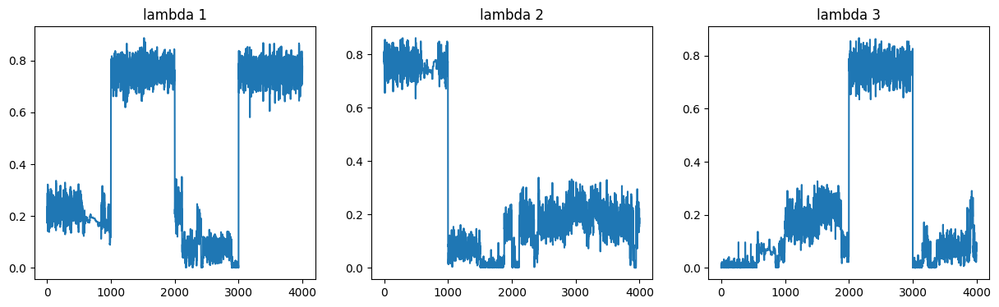

In [166]:
figlx, (lxa, lxb, lxc) = plt.subplots(1, 3, figsize=(15,4))

lxa.plot(fitlx.draws_pd()['lambda[1]'])
lxa.set_title('lambda 1')

lxb.plot(fitlx.draws_pd()['lambda[2]'])
lxb.set_title('lambda 2')

lxc.plot(fitlx.draws_pd()['lambda[3]'])
lxc.set_title('lambda 3')

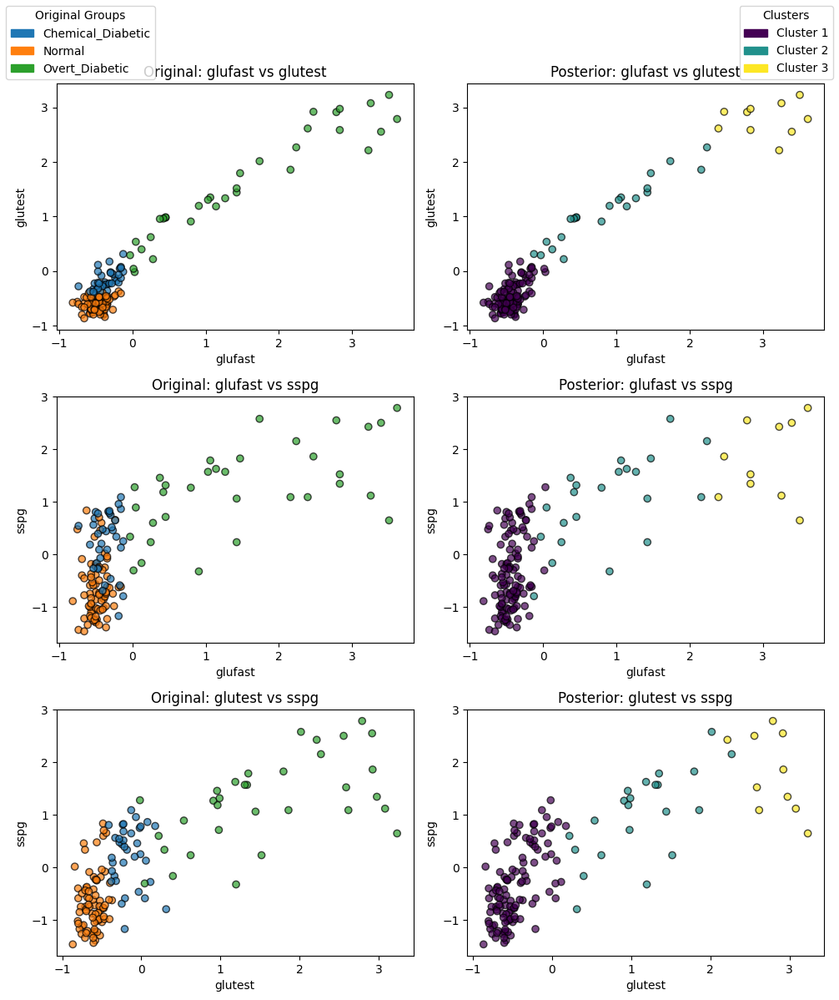

In [167]:
label_problx = fitlx.stan_variable('label_prob')
label_problx_mean = np.mean(label_problx, axis=0)
cluster_assignmentlx = np.argmax(label_problx_mean, axis=1)

feature_names = list(tranx_dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = tranx_diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        tranx_dia.iloc[:, i], tranx_dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        tranx_diab.iloc[:, i], tranx_diab.iloc[:, j],
        c=cluster_assignmentlx, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentlx)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [148]:
mapping = {
    'Normal': 0,
    'Chemical_Diabetic': 1,
    'Overt_Diabetic': 2
}
diab_labels = np.array([mapping[g] for g in diab['group'].values])
 
matchlx = (cluster_assignmentlx == diab_labels)
accuracy = matchlx.mean() * 100
 
print("Number of matches:", matchlx.sum(), "out of", len(matchlx))
print(f"Accuracy: {accuracy:.2f}%")

Number of matches: 123 out of 145
Accuracy: 84.83%


In [237]:
c_data = {'N' : tranc_dia.shape[0], 'D': tranc_dia.shape[1],  'y': tranc_dia}
fitlc = modell.sample(data = c_data)

20:51:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:51:23 - cmdstanpy - INFO - CmdStan done processing.
20:51:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[3] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[3] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[3] is 0, but must be positive! (in 'lkj.stan', line 28, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'lkj.st

In [238]:
fitlc.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-494.749000,0.214417,4.639950,-502.953000,-494.277000,-487.890000,468.28300,21.003000,1.00536
lambda[1],0.407453,0.144452,0.209987,0.156224,0.331591,0.692914,2.11318,0.094778,4.24638
lambda[2],0.402562,0.146093,0.212790,0.132118,0.392645,0.681582,2.12151,0.095152,4.06821
lambda[3],0.189985,0.002218,0.056513,0.102068,0.188830,0.282305,649.30700,29.122100,1.01285


Text(0.5, 1.0, 'lambda 3')

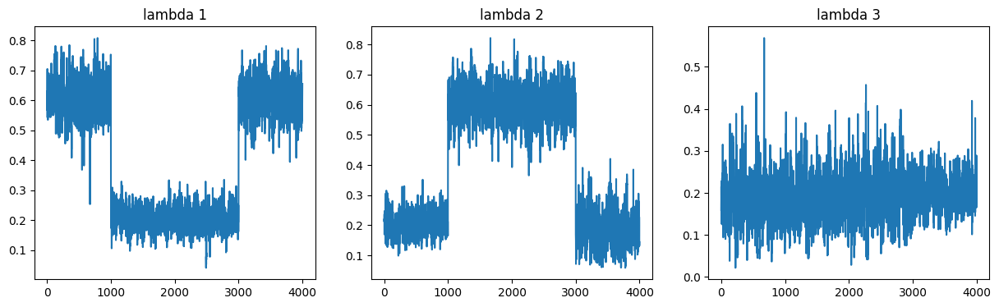

In [239]:
figlc, (lca, lcb, lcc) = plt.subplots(1, 3, figsize=(15,4))

lca.plot(fitlc.draws_pd()['lambda[1]'])
lca.set_title('lambda 1')

lcb.plot(fitlc.draws_pd()['lambda[2]'])
lcb.set_title('lambda 2')

lcc.plot(fitlc.draws_pd()['lambda[3]'])
lcc.set_title('lambda 3')

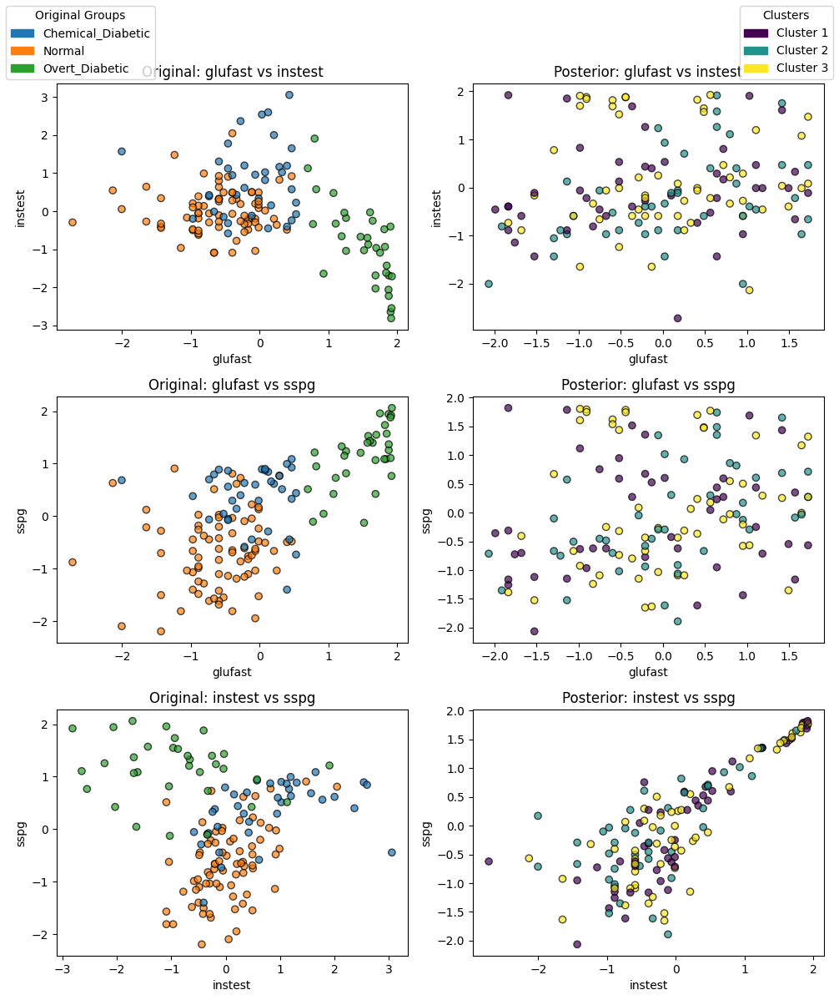

In [240]:
label_problc = fitlc.stan_variable('label_prob')
label_problc_mean = np.mean(label_problc, axis=0)
cluster_assignmentlc = np.argmax(label_problc_mean, axis=1)

feature_names = list(tranc_dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = tranc_diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        tranc_dia.iloc[:, i], tranc_dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        tranc_diab.iloc[:, i], tranc_diab.iloc[:, j],
        c=cluster_assignmentlc, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentlc)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [70]:
modelb_code = os.path.join('.', 'both.stan')
modelb = CmdStanModel(stan_file=modelb_code)

17:56:24 - cmdstanpy - INFO - compiling stan file /tmp/tmphvyxb7zv/tmpzgpxtjar.stan to exe file /bml24/Assignment 10/both
17:56:51 - cmdstanpy - INFO - compiled model executable: /bml24/Assignment 10/both


In [71]:
b_data = {'N' : dia.shape[0], 'D': dia.shape[1],  'y': dia}
fitb = modelb.sample(data = b_data)

17:56:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

18:08:03 - cmdstanpy - INFO - CmdStan done processing.
18:08:03 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in '

In [72]:
fitb.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-3479.620000,0.170579,5.991360,-3490.210000,-3479.320000,-3470.360000,1233.67000,1.203700,1.00737
lambda[1],0.251561,0.299403,0.424110,0.000492,0.007542,0.994150,2.00653,0.001958,58.98430
lambda[2],0.741479,0.299519,0.424295,0.001543,0.984578,0.996955,2.00672,0.001958,50.31200
lambda[3],0.006961,0.000120,0.007023,0.000339,0.004684,0.021062,3430.08000,3.346770,1.00057


Text(0.5, 1.0, 'lambda 3')

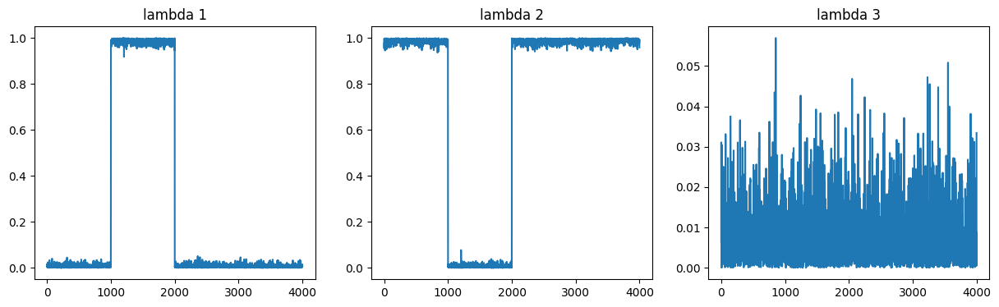

In [73]:
figb, (ba, bb, bc) = plt.subplots(1, 3, figsize=(15,4))

ba.plot(fitb.draws_pd()['lambda[1]'])
ba.set_title('lambda 1')

bb.plot(fitb.draws_pd()['lambda[2]'])
bb.set_title('lambda 2')

bc.plot(fitb.draws_pd()['lambda[3]'])
bc.set_title('lambda 3')

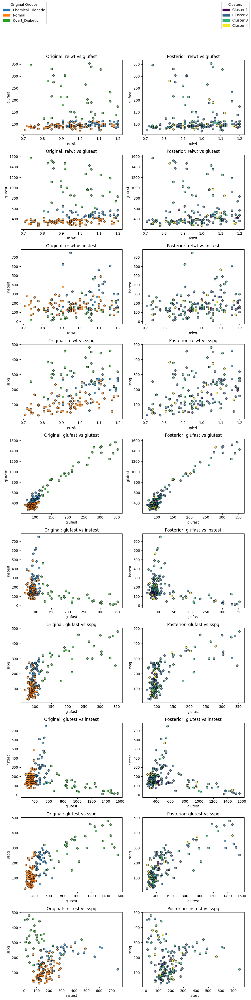

In [74]:
label_probb = fitb.stan_variable('label_prob')
label_probb_mean = np.mean(label_probb, axis=0)
cluster_assignmentb = np.argmax(label_probb_mean, axis=1)

feature_names = list(dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        dia.iloc[:, i], dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        diab.iloc[:, i], diab.iloc[:, j],
        c=cluster_assignmentb, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentb)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [75]:
t_data = {'N' : trans_dia.shape[0], 'D': trans_dia.shape[1],  'y': trans_dia}
fitbt = modelp.sample(data = t_data)

18:08:09 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

18:11:29 - cmdstanpy - INFO - CmdStan done processing.
18:11:29 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -inf, but random variable[2,1] = -inf (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: random variable is not symmetric. random variable[1,2] = -nan, but random variable[2,1] = -nan (in 'parsed_mu.stan', line 31, column 4 to column 65)
	Exception: inv_wishart_lpdf: LDLT_Factor of random variable is not positive definite.  last conditional variance is -4.54747e-13. (in 'parsed_mu.stan', line 31, co

In [76]:
fitbt.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-571.320000,4.415220,9.274160,-586.950000,-571.010000,-556.638000,4.41208,0.012272,1.33708
lambda[1],0.433727,0.216072,0.307362,0.042192,0.595391,0.782628,2.02349,0.005628,10.07510
lambda[2],0.467442,0.185435,0.264459,0.162990,0.594827,0.777098,2.03391,0.005657,7.98683
lambda[3],0.098831,0.044193,0.066474,0.032686,0.070455,0.231128,2.26253,0.006293,2.80541


Text(0.5, 1.0, 'lambda 3')

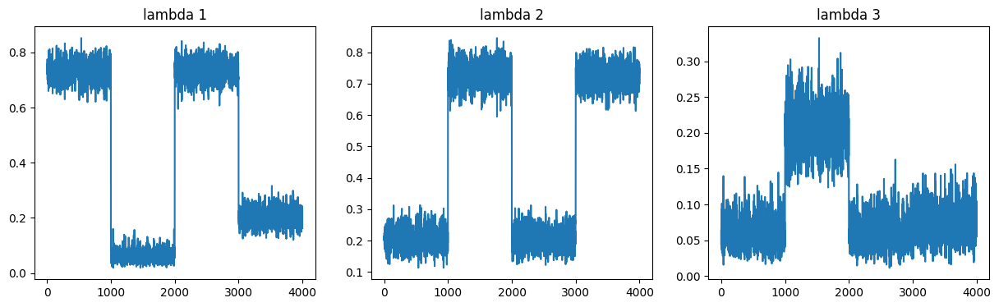

In [77]:
figbt, (bta, btb, btc) = plt.subplots(1, 3, figsize=(15,4))

bta.plot(fitbt.draws_pd()['lambda[1]'])
bta.set_title('lambda 1')

btb.plot(fitbt.draws_pd()['lambda[2]'])
btb.set_title('lambda 2')

btc.plot(fitbt.draws_pd()['lambda[3]'])
btc.set_title('lambda 3')

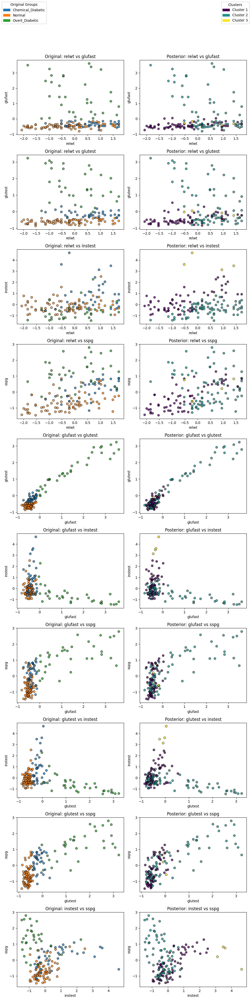

In [82]:
label_probbt = fitbt.stan_variable('label_prob')
label_probbt_mean = np.mean(label_probbt, axis=0)
cluster_assignmentbt = np.argmax(label_probbt_mean, axis=1)

feature_names = list(trans_dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = trans_diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        trans_dia.iloc[:, i], trans_dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        trans_diab.iloc[:, i], trans_diab.iloc[:, j],
        c=cluster_assignmentbt, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentbt)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [126]:
mapping = {
    'Normal': 0,
    'Chemical_Diabetic': 2,
    'Overt_Diabetic': 1
}
diab_labels = np.array([mapping[g] for g in diab['group'].values])
 
matchbt = (cluster_assignmentbt == diab_labels)
accuracy = matchbt.mean() * 100
 
print("Number of matches:", matchbt.sum(), "out of", len(matchbt))
print(f"Accuracy: {accuracy:.2f}%")

Number of matches: 75 out of 145
Accuracy: 51.72%


In [168]:
x_data = {'N' : tranx_dia.shape[0], 'D': tranx_dia.shape[1],  'y': tranx_dia}
fitbx = modelb.sample(data = x_data)

19:50:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

19:51:35 - cmdstanpy - INFO - CmdStan done processing.
19:51:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[3] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[3] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'b

In [169]:
fitbx.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-214.379000,6.087400,9.468320,-228.895000,-215.448000,-201.641000,2.41926,0.027065,2.34114
lambda[1],0.632626,0.098685,0.147013,0.346453,0.659808,0.797801,2.21926,0.024827,3.07271
lambda[2],0.149737,0.108971,0.159659,0.000759,0.078664,0.440931,2.14664,0.024015,3.75103
lambda[3],0.217637,0.023320,0.048235,0.146085,0.215497,0.300198,4.27809,0.047860,1.38228


Text(0.5, 1.0, 'lambda 3')

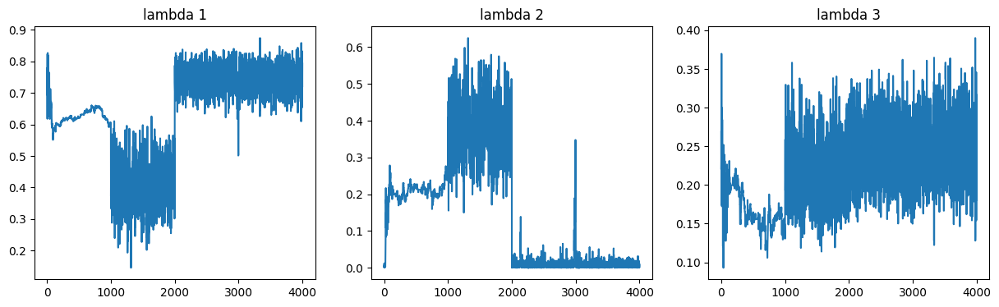

In [170]:
figbx, (bxa, bxb, bxc) = plt.subplots(1, 3, figsize=(15,4))

bxa.plot(fitbx.draws_pd()['lambda[1]'])
bxa.set_title('lambda 1')

bxb.plot(fitbx.draws_pd()['lambda[2]'])
bxb.set_title('lambda 2')

bxc.plot(fitbx.draws_pd()['lambda[3]'])
bxc.set_title('lambda 3')

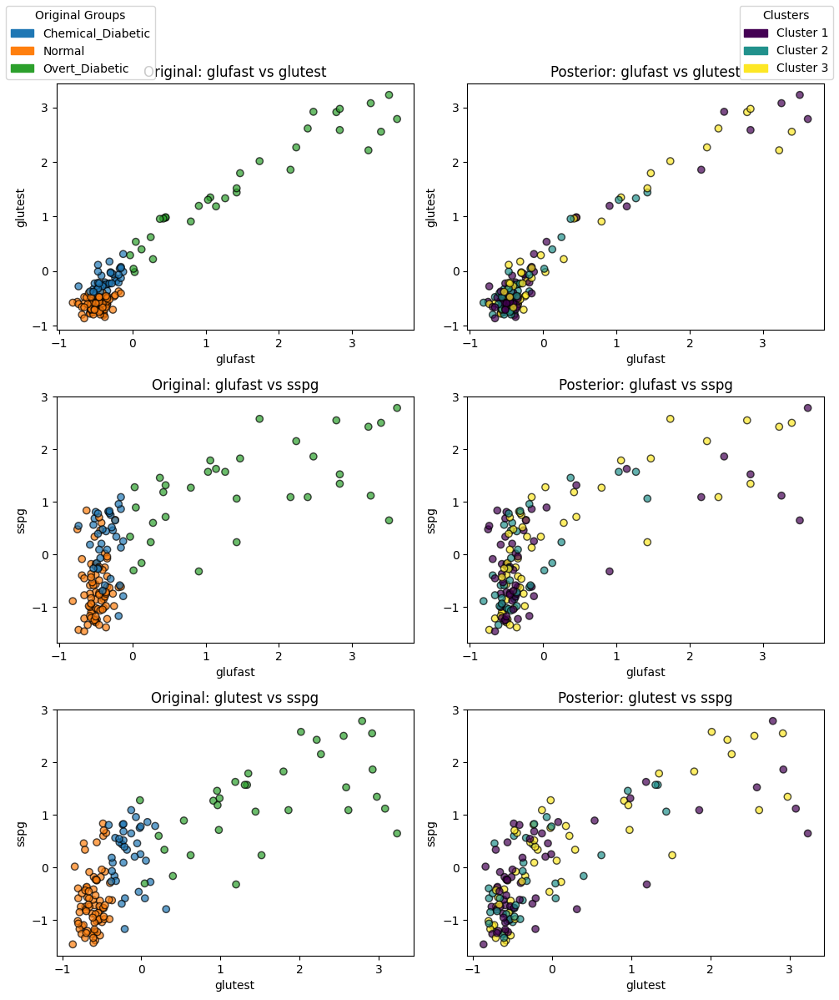

In [172]:
label_probbx = fitbx.stan_variable('label_prob')
label_probbx_mean = np.mean(label_probbx, axis=0)
cluster_assignmentbx = np.argmax(label_probbx_mean, axis=1)

feature_names = list(tranx_dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = tranx_diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        tranx_dia.iloc[:, i], tranx_dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        tranx_diab.iloc[:, i], tranx_diab.iloc[:, j],
        c=cluster_assignmentbx, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentbx)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [179]:
mapping = {
    'Normal': 0,
    'Chemical_Diabetic': 1,
    'Overt_Diabetic': 2
}
diab_labels = np.array([mapping[g] for g in diab['group'].values])
 
matchbx = (cluster_assignmentbx == diab_labels)
accuracy = matchbx.mean() * 100
 
print("Number of matches:", matchbx.sum(), "out of", len(matchbx))
print(f"Accuracy: {accuracy:.2f}%")

Number of matches: 57 out of 145
Accuracy: 39.31%


In [241]:
c_data = {'N' : tranc_dia.shape[0], 'D': tranc_dia.shape[1],  'y': tranc_dia}
fitbc = modelb.sample(data = c_data)

20:51:56 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:52:48 - cmdstanpy - INFO - CmdStan done processing.
20:52:48 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[3] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'both.stan', line 36, column 4 to column 34)
	Exception: lkj_corr_cholesky_lpdf: Random variable[2] is 0, but must be positive! (in 'b

In [242]:
fitbc.summary().iloc[0:4]

,Mean,MCSE,StdDev,5%,50%,95%,N_Eff,N_Eff/s,R_hat
lp__,-496.013000,0.360405,4.749130,-504.423000,-495.558000,-489.130000,173.63900,3.002880,1.01919
lambda[1],0.496438,0.133328,0.195489,0.121371,0.582858,0.681022,2.14981,0.037178,3.67810
lambda[2],0.294806,0.132382,0.194424,0.115450,0.204358,0.666849,2.15695,0.037302,3.60589
lambda[3],0.208756,0.001550,0.037538,0.148628,0.208114,0.269778,586.40400,10.141200,1.01102


Text(0.5, 1.0, 'lambda 3')

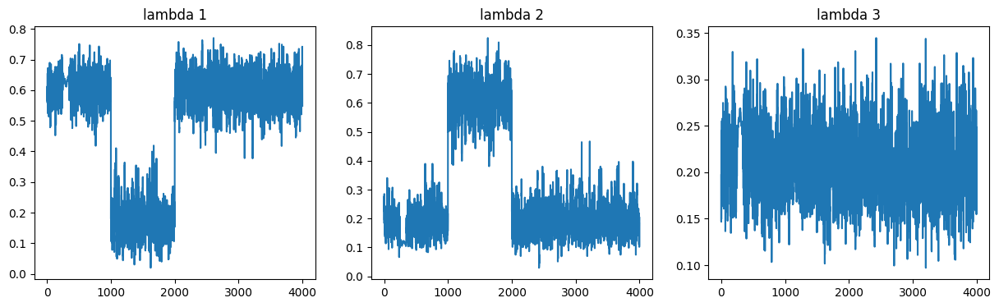

In [243]:
figbc, (bca, bcb, bcc) = plt.subplots(1, 3, figsize=(15,4))

bca.plot(fitbc.draws_pd()['lambda[1]'])
bca.set_title('lambda 1')

bcb.plot(fitbc.draws_pd()['lambda[2]'])
bcb.set_title('lambda 2')

bcc.plot(fitbc.draws_pd()['lambda[3]'])
bcc.set_title('lambda 3')

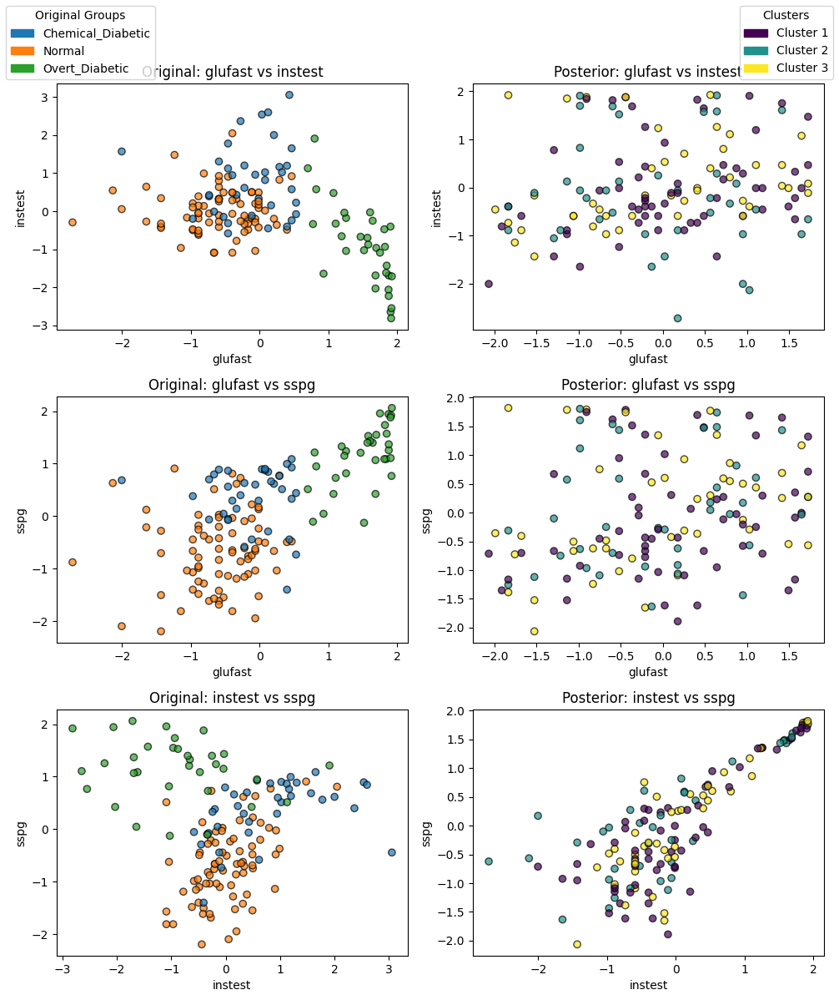

In [244]:
label_probbc = fitbc.stan_variable('label_prob')
label_probbc_mean = np.mean(label_probbc, axis=0)
cluster_assignmentbc = np.argmax(label_probbc_mean, axis=1)

feature_names = list(tranc_dia) 
num_features = len(feature_names)

pairs = list(itertools.combinations(range(num_features), 2))
n_pairs = len(pairs)
 
original_labels = tranc_diab['group'].values
numeric_labels = pd.Categorical(original_labels).codes
original_cat = pd.Categorical(original_labels)
categories = original_cat.categories
codes = original_cat.codes
 
# Create colormap and get colors for each category code
cmap = plt.get_cmap('tab10')
colors = cmap(np.arange(len(categories)))
 
 
fig, axes = plt.subplots(nrows=n_pairs, ncols=2, figsize=(10, 4*n_pairs))
 
for idx, (i, j) in enumerate(pairs):
    ax_left = axes[idx, 0] if n_pairs > 1 else axes[0]
    ax_right = axes[idx, 1] if n_pairs > 1 else axes[1]
    
    # Left: use mapped colors by manually assigning colors based on code
    point_colors = [colors[code] for code in codes]
    ax_left.scatter(
        tranc_dia.iloc[:, i], tranc_dia.iloc[:, j],
        c=point_colors, edgecolors='k', alpha=0.7
    )
    ax_left.set_xlabel(feature_names[i])
    ax_left.set_ylabel(feature_names[j])
    ax_left.set_title(f'Original: {feature_names[i]} vs {feature_names[j]}')
 
    # Right: cluster plot as before
    ax_right.scatter(
        tranc_diab.iloc[:, i], tranc_diab.iloc[:, j],
        c=cluster_assignmentbc, cmap='viridis', edgecolors='k', alpha=0.7
    )
    ax_right.set_xlabel(feature_names[i])
    ax_right.set_ylabel(feature_names[j])
    ax_right.set_title(f'Posterior: {feature_names[i]} vs {feature_names[j]}')
 
# Legend for original groups
orig_patches = [mpatches.Patch(color=colors[i], label=categories[i]) for i in range(len(categories))]
fig.legend(handles=orig_patches, loc='upper left', title='Original Groups')
 
# Legend for clusters remains the same as before
unique_clusters = np.unique(cluster_assignmentbc)
cluster_cmap = plt.cm.viridis(np.linspace(0, 1, len(unique_clusters)))
cluster_patches = [mpatches.Patch(color=cluster_cmap[i], label=f'Cluster {unique_clusters[i]+1}') for i in range(len(unique_clusters))]
fig.legend(handles=cluster_patches, loc='upper right', title='Clusters')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()